In [1]:
import pandas as pd

In [2]:
import pyfolio

/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/pos.py:27: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  'Module "zipline.assets" not found; multipliers will not be applied'


In [3]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
matplotlib.use('Agg')
%matplotlib inline

In [4]:
# training start at 2009-01-01, validation start at 2015-10-01, trading start at 2016-01-01 and end to 2020-05-08
df = pd.read_csv('data/kospi_30_2009_2020.csv')
#unique_trade_date = df[(df.datadate > 20151001)&(df.datadate <= 20200707)].datadate.unique()
unique_trade_date = df[(df.datadate > 20151001)].datadate.unique()
df_trade_date = pd.DataFrame({'datadate':unique_trade_date})

In [5]:
len(unique_trade_date)

1198

In [6]:
df_trade_date[62:]

,datadate
62,20160104
63,20160105
64,20160106
65,20160107
66,20160108
...,...
1193,20200811
1194,20200812
1195,20200813
1196,20200814


In [7]:
def get_account_value(rebalance_window, validation_window, data_name, model_name, model_name2, number):
    df_account_value = pd.DataFrame()
    for i in range(rebalance_window + validation_window, len(unique_trade_date)+1, rebalance_window):
        tmp = pd.read_csv(f'resultss/result_{data_name}_{model_name}_{number}/{data_name}_account_value_trade_{model_name2}_{i}.csv')
        df_account_value = df_account_value.append(tmp, ignore_index=True)
    df_account_value = pd.DataFrame({'account_value':df_account_value['0']})
    df_account_value = df_account_value.join(df_trade_date[62:].reset_index(drop=True))
    return df_account_value

In [8]:
def get_daily_return(df):
    df['daily_return']=df.account_value.pct_change(1)
    return df

In [9]:
def backtest_strat(df):
    strategy_ret = df.copy()
    strategy_ret['Date'] = pd.to_datetime(strategy_ret['Date'])
    strategy_ret.set_index('Date',drop = False, inplace = True)
    strategy_ret.index = strategy_ret.index.tz_localize('UTC')
    del strategy_ret['Date']
    ts = pd.Series(strategy_ret['daily_return'].values, index=strategy_ret.index)
    return ts

# KOSPI 30

In [10]:
kospi = pd.read_csv('data/kospi30Average.csv')
#test_kospi = kospi[(kospi['Date']>='2016-01-01')&(kospi['Date']<='2020-07-07')]
test_kospi = kospi[(kospi['Date']>='2016-01-01')]
test_kospi.reset_index(drop=True,inplace=True)

In [11]:
test_kospi['daily_return'] = test_kospi['Close'].pct_change(1)
test_kospi['cumulative_return_djia'] = (test_kospi["Close"] - test_kospi["Close"][0])/test_kospi["Close"][0]
display(test_kospi)

/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Date,Close,daily_return,cumulative_return_djia
0,2016-01-04,148632.166667,NaN,0.000000
1,2016-01-05,148923.866667,0.001963,0.001963
2,2016-01-06,149036.800000,0.000758,0.002722
3,2016-01-07,147307.966667,-0.011600,-0.008909
4,2016-01-08,149028.200000,0.011678,0.002665
...,...,...,...,...
1131,2020-08-11,227306.933333,0.030242,0.529325
1132,2020-08-12,225187.733333,-0.009323,0.515067
1133,2020-08-13,227326.566667,0.009498,0.529457
1134,2020-08-14,224025.200000,-0.014523,0.507246


In [12]:
dow_strat = backtest_strat(test_kospi[:1134])
#display(pd.DataFrame(dow_strat))

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,9.903%
Cumulative returns,52.946%
Annual volatility,18.228%
Sharpe ratio,0.61
Calmar ratio,0.29
Stability,0.42
Max drawdown,-34.186%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,34.19,2018-01-16,2020-03-19,2020-06-24,637
1,11.93,2016-07-04,2016-12-02,2017-05-08,221
2,6.28,2016-01-13,2016-02-17,2016-03-16,46
3,5.16,2016-04-25,2016-05-24,2016-06-08,33
4,4.89,2016-06-08,2016-06-17,2016-07-04,19


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


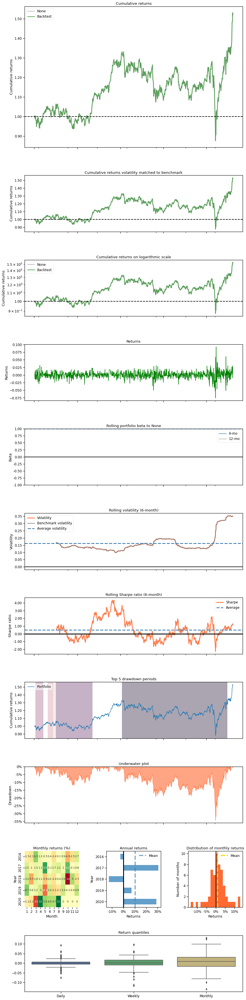

In [13]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = dow_strat, benchmark_rets = dow_strat, set_context=False)

## Ensemble

In [27]:
kospi_ensemble_1_account_value = get_account_value(63, 63, 'kospi', 'ensemble', 'ensemble', 1)
kospi_ensemble_2_account_value = get_account_value(63, 63, 'kospi', 'ensemble', 'ensemble', 2)
kospi_ensemble_3_account_value = get_account_value(63, 63, 'kospi', 'ensemble', 'ensemble', 3)
kospi_ensemble_4_account_value = get_account_value(63, 63, 'kospi', 'ensemble', 'ensemble', 4)
kospi_ensemble_5_account_value = get_account_value(63, 63, 'kospi', 'ensemble', 'ensemble', 5)
kospi_ensemble_1_account_value

,account_value,datadate
0,1.000000e+09,20160104
1,1.000895e+09,20160105
2,9.953760e+08,20160106
3,1.000467e+09,20160107
4,9.921822e+08,20160108
...,...,...
1129,2.086774e+09,20200807
1130,2.097205e+09,20200810
1131,2.057663e+09,20200811
1132,2.064673e+09,20200812


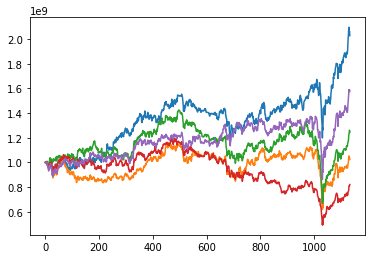

In [28]:
kospi_ensemble_1_account_value.account_value.plot()
kospi_ensemble_2_account_value.account_value.plot()
kospi_ensemble_3_account_value.account_value.plot()
kospi_ensemble_4_account_value.account_value.plot()
kospi_ensemble_5_account_value.account_value.plot()

In [29]:
kospi_ensemble_1_account_value = get_daily_return(kospi_ensemble_1_account_value)
kospi_ensemble_2_account_value = get_daily_return(kospi_ensemble_2_account_value)
kospi_ensemble_3_account_value = get_daily_return(kospi_ensemble_3_account_value)
kospi_ensemble_4_account_value = get_daily_return(kospi_ensemble_4_account_value)
kospi_ensemble_5_account_value = get_daily_return(kospi_ensemble_5_account_value)

In [30]:
kospi_ensemble_1_account_value['Date'] = test_kospi['Date']
kospi_ensemble_2_account_value['Date'] = test_kospi['Date']
kospi_ensemble_3_account_value['Date'] = test_kospi['Date']
kospi_ensemble_4_account_value['Date'] = test_kospi['Date']
kospi_ensemble_5_account_value['Date'] = test_kospi['Date']
#display(kospi_ensemble_1_account_value)

In [31]:
kospi_ensemble_1_strat = backtest_strat(kospi_ensemble_1_account_value)
kospi_ensemble_2_strat = backtest_strat(kospi_ensemble_2_account_value)
kospi_ensemble_3_strat = backtest_strat(kospi_ensemble_3_account_value)
kospi_ensemble_4_strat = backtest_strat(kospi_ensemble_4_account_value)
kospi_ensemble_5_strat = backtest_strat(kospi_ensemble_5_account_value)
#display(pd.DataFrame(kospi_ensemble_1_strat))

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,10.633%
Cumulative returns,57.572%
Annual volatility,21.334%
Sharpe ratio,0.58
Calmar ratio,0.29
Stability,0.72
Max drawdown,-37.26%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,37.26,2020-02-11,2020-03-18,2020-06-04,83
1,13.44,2018-09-28,2018-10-26,2018-11-28,44
2,11.57,2018-01-26,2018-02-08,2018-09-12,164
3,11.40,2016-01-07,2016-02-16,2016-04-12,69
4,10.31,2019-04-16,2019-05-23,2020-01-10,194


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


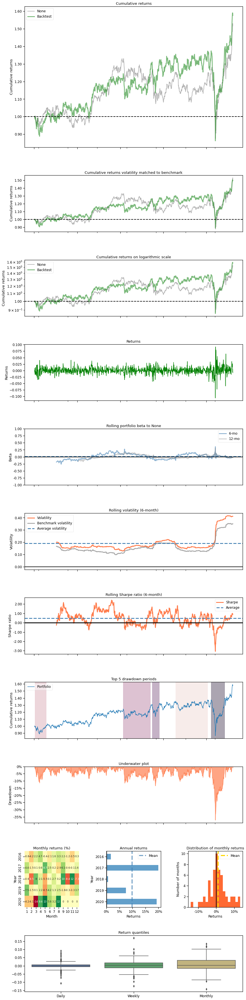

In [32]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ensemble_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [33]:
term = '(2016/01/04-2020/08/13)'
ensemble_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_ensemble_1':['102.921%','17.029%','20.544%','0.87','-28.402%'],
                          'kospi_ensemble_2':['2.349%','0.517%','24.307%','0.14','-46.995%'],
                          'kospi_ensemble_3':['24.412%','4.974%','21.779%','0.33','-53.201%'],
                          'kospi_ensemble_4':['-17.996%','-4.313%','20.813%','-0.11','-58.785%'],
                          'kospi_ensemble_5':['57.572%','10.633%','21.334%','0.58','-37.26%'],
                          }
ensemble_performance_evaluation = pd.DataFrame(ensemble_performance_evaluation).set_index(term)
ensemble_performance_evaluation.to_csv('performance/kospi_ensemble_performance_evaluation_comparison.csv',index=True)
display(ensemble_performance_evaluation)

,kospi_ensemble_1,kospi_ensemble_2,kospi_ensemble_3,kospi_ensemble_4,kospi_ensemble_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,102.921%,2.349%,24.412%,-17.996%,57.572%
Annual Return,17.029%,0.517%,4.974%,-4.313%,10.633%
Annual Volatility,20.544%,24.307%,21.779%,20.813%,21.334%
Sharpe Ratio,0.87,0.14,0.33,-0.11,0.58
Max Dragdown,-28.402%,-46.995%,-53.201%,-58.785%,-37.26%


In [34]:
ensemble_performance_evaluation_transpose = ensemble_performance_evaluation.T
ensemble_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
ensemble_performance_evaluation_transpose = ensemble_performance_evaluation_transpose.apply(pd.to_numeric)
display(ensemble_performance_evaluation_transpose)
display(ensemble_performance_evaluation_transpose.dtypes)

(2016/01/04-2020/08/13),Cumulative Return,Annual Return,Annual Volatility,Sharpe Ratio,Max Dragdown
kospi_ensemble_1,102.921,17.029,20.544,0.87,-28.402
kospi_ensemble_2,2.349,0.517,24.307,0.14,-46.995
kospi_ensemble_3,24.412,4.974,21.779,0.33,-53.201
kospi_ensemble_4,-17.996,-4.313,20.813,-0.11,-58.785
kospi_ensemble_5,57.572,10.633,21.334,0.58,-37.260


(2016/01/04-2020/08/13)
Cumulative Return    float64
Annual Return        float64
Annual Volatility    float64
Sharpe Ratio         float64
Max Dragdown         float64
dtype: object

In [35]:
ensemble_performance_evaluation_transpose['Cumulative Return'].mean()
#ensemble_performance_evaluation_transpose['Annual Return'].mean()
#ensemble_performance_evaluation_transpose['Annual Volatility'].mean()
#ensemble_performance_evaluation_transpose['Sharpe Ratio'].mean()
#ensemble_performance_evaluation_transpose['Max Dragdown'].mean()

33.851600000000005

### Ensemble ver1 HMAX_NORMALIZE=10 & Hold Range = 0 to 3 with int share

In [14]:
kospi_ensemble_ver1_1_account_value = get_account_value(63, 63, 'kospi', 'ensemble_HMAX_NORMALIZE10_hold0to3', 'ensemble', 1)
kospi_ensemble_ver1_2_account_value = get_account_value(63, 63, 'kospi', 'ensemble_HMAX_NORMALIZE10_hold0to3', 'ensemble', 2)
kospi_ensemble_ver1_3_account_value = get_account_value(63, 63, 'kospi', 'ensemble_HMAX_NORMALIZE10_hold0to3', 'ensemble', 3)
kospi_ensemble_ver1_4_account_value = get_account_value(63, 63, 'kospi', 'ensemble_HMAX_NORMALIZE10_hold0to3', 'ensemble', 4)
kospi_ensemble_ver1_5_account_value = get_account_value(63, 63, 'kospi', 'ensemble_HMAX_NORMALIZE10_hold0to3', 'ensemble', 5)

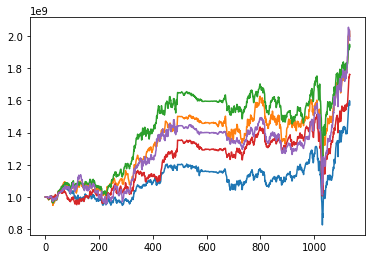

In [15]:
kospi_ensemble_ver1_1_account_value.account_value.plot()
kospi_ensemble_ver1_2_account_value.account_value.plot()
kospi_ensemble_ver1_3_account_value.account_value.plot()
kospi_ensemble_ver1_4_account_value.account_value.plot()
kospi_ensemble_ver1_5_account_value.account_value.plot()

In [16]:
kospi_ensemble_ver1_1_account_value = get_daily_return(kospi_ensemble_ver1_1_account_value)
kospi_ensemble_ver1_2_account_value = get_daily_return(kospi_ensemble_ver1_2_account_value)
kospi_ensemble_ver1_3_account_value = get_daily_return(kospi_ensemble_ver1_3_account_value)
kospi_ensemble_ver1_4_account_value = get_daily_return(kospi_ensemble_ver1_4_account_value)
kospi_ensemble_ver1_5_account_value = get_daily_return(kospi_ensemble_ver1_5_account_value)

In [17]:
kospi_ensemble_ver1_1_account_value['Date'] = test_kospi['Date']
kospi_ensemble_ver1_2_account_value['Date'] = test_kospi['Date']
kospi_ensemble_ver1_3_account_value['Date'] = test_kospi['Date']
kospi_ensemble_ver1_4_account_value['Date'] = test_kospi['Date']
kospi_ensemble_ver1_5_account_value['Date'] = test_kospi['Date']

In [18]:
kospi_ensemble_ver1_1_strat = backtest_strat(kospi_ensemble_ver1_1_account_value)
kospi_ensemble_ver1_2_strat = backtest_strat(kospi_ensemble_ver1_2_account_value)
kospi_ensemble_ver1_3_strat = backtest_strat(kospi_ensemble_ver1_3_account_value)
kospi_ensemble_ver1_4_strat = backtest_strat(kospi_ensemble_ver1_4_account_value)
kospi_ensemble_ver1_5_strat = backtest_strat(kospi_ensemble_ver1_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,16.629%
Cumulative returns,99.814%
Annual volatility,17.65%
Sharpe ratio,0.96
Calmar ratio,0.64
Stability,0.77
Max drawdown,-26.044%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,26.04,2019-04-10,2020-03-18,2020-06-02,300
1,11.57,2018-03-14,2018-12-28,2019-02-19,245
2,8.15,2016-07-12,2016-11-17,2017-01-03,126
3,7.97,2020-06-10,2020-06-12,2020-06-23,10
4,7.65,2017-03-20,2017-04-18,2017-05-04,34


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


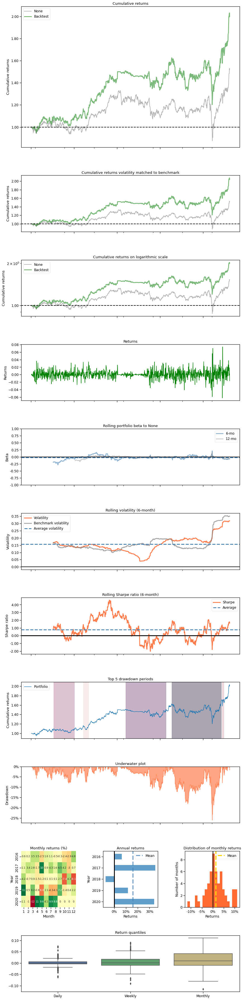

In [25]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ensemble_ver1_2_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [26]:
term = '(2016/01/04-2020/08/13)'
ensemble_ver1_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_ppo_1':['57.216%','10.577%','18.087%','0.65','-37.099%'],
                          'kospi_ppo_2':['99.814%','16.629%','17.65%','0.96','-26.044%'],
                          'kospi_ppo_3':['93.249%','15.766%','17.778%','0.91','-33.115%'],
                          'kospi_ppo_4':['76.005%','13.386%','16.524%','0.84','-33.381%'],
                          'kospi_ppo_5':['97.341%','16.307%','19.816%','0.86','-36.001%'],
                          }
ensemble_ver1_performance_evaluation = pd.DataFrame(ensemble_ver1_performance_evaluation).set_index(term)
ensemble_ver1_performance_evaluation.to_csv('performance/kospi_ensemble_ver1_performance_evaluation_comparison.csv',index=True)
display(ensemble_ver1_performance_evaluation)

,kospi_ppo_1,kospi_ppo_2,kospi_ppo_3,kospi_ppo_4,kospi_ppo_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,57.216%,99.814%,93.249%,76.005%,97.341%
Annual Return,10.577%,16.629%,15.766%,13.386%,16.307%
Annual Volatility,18.087%,17.65%,17.778%,16.524%,19.816%
Sharpe Ratio,0.65,0.96,0.91,0.84,0.86
Max Dragdown,-37.099%,-26.044%,-33.115%,-33.381%,-36.001%


In [27]:
ensemble_ver1_performance_evaluation_transpose = ensemble_ver1_performance_evaluation.T
ensemble_ver1_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
ensemble_ver1_performance_evaluation_transpose = ensemble_ver1_performance_evaluation_transpose.apply(pd.to_numeric)
display(ensemble_ver1_performance_evaluation_transpose)
display(ensemble_ver1_performance_evaluation_transpose.dtypes)

(2016/01/04-2020/08/13),Cumulative Return,Annual Return,Annual Volatility,Sharpe Ratio,Max Dragdown
kospi_ppo_1,57.216,10.577,18.087,0.65,-37.099
kospi_ppo_2,99.814,16.629,17.650,0.96,-26.044
kospi_ppo_3,93.249,15.766,17.778,0.91,-33.115
kospi_ppo_4,76.005,13.386,16.524,0.84,-33.381
kospi_ppo_5,97.341,16.307,19.816,0.86,-36.001


(2016/01/04-2020/08/13)
Cumulative Return    float64
Annual Return        float64
Annual Volatility    float64
Sharpe Ratio         float64
Max Dragdown         float64
dtype: object

In [28]:
ensemble_ver1_performance_evaluation_transpose['Cumulative Return'].mean()
#ensemble_ver1_performance_evaluation_transpose['Annual Return'].mean()
#ensemble_ver1_performance_evaluation_transpose['Annual Volatility'].mean()
#ensemble_ver1_performance_evaluation_transpose['Sharpe Ratio'].mean()
#ensemble_ver1_performance_evaluation_transpose['Max Dragdown'].mean()

84.725

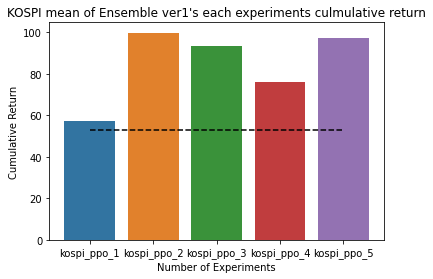

In [29]:
real_kospi = 52.946
sns.barplot(y= ensemble_ver1_performance_evaluation_transpose['Cumulative Return'], x=ensemble_ver1_performance_evaluation_transpose.index )
sns.lineplot(y=real_kospi,x=ensemble_ver1_performance_evaluation_transpose.index,color='black',linestyle='--')
plt.title("KOSPI mean of Ensemble ver1's each experiments culmulative return")
plt.xlabel('Number of Experiments')
plt.ylabel('Cumulative Return')
plt.savefig('./performance/kospi_ensemble_ver1.png',dpi=500)

### A2C ver1 HMAX_NORMALIZE=10 & Hold Range = 0 to 3 with int share

In [50]:
kospi_a2c_ver1_1_account_value = get_account_value(63, 63, 'kospi', 'a2c_HMAX_NORMALIZE10_hold0to3', 'A2C', 1)
kospi_a2c_ver1_2_account_value = get_account_value(63, 63, 'kospi', 'a2c_HMAX_NORMALIZE10_hold0to3', 'A2C', 2)
kospi_a2c_ver1_3_account_value = get_account_value(63, 63, 'kospi', 'a2c_HMAX_NORMALIZE10_hold0to3', 'A2C', 3)
kospi_a2c_ver1_4_account_value = get_account_value(63, 63, 'kospi', 'a2c_HMAX_NORMALIZE10_hold0to3', 'A2C', 4)
kospi_a2c_ver1_5_account_value = get_account_value(63, 63, 'kospi', 'a2c_HMAX_NORMALIZE10_hold0to3', 'A2C', 5)

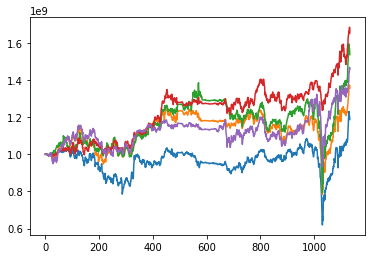

In [51]:
kospi_a2c_ver1_1_account_value.account_value.plot()
kospi_a2c_ver1_2_account_value.account_value.plot()
kospi_a2c_ver1_3_account_value.account_value.plot()
kospi_a2c_ver1_4_account_value.account_value.plot()
kospi_a2c_ver1_5_account_value.account_value.plot()

In [52]:
kospi_a2c_ver1_1_account_value = get_daily_return(kospi_a2c_ver1_1_account_value)
kospi_a2c_ver1_2_account_value = get_daily_return(kospi_a2c_ver1_2_account_value)
kospi_a2c_ver1_3_account_value = get_daily_return(kospi_a2c_ver1_3_account_value)
kospi_a2c_ver1_4_account_value = get_daily_return(kospi_a2c_ver1_4_account_value)
kospi_a2c_ver1_5_account_value = get_daily_return(kospi_a2c_ver1_5_account_value)

In [53]:
kospi_a2c_ver1_1_account_value['Date'] = test_kospi['Date']
kospi_a2c_ver1_2_account_value['Date'] = test_kospi['Date']
kospi_a2c_ver1_3_account_value['Date'] = test_kospi['Date']
kospi_a2c_ver1_4_account_value['Date'] = test_kospi['Date']
kospi_a2c_ver1_5_account_value['Date'] = test_kospi['Date']

In [54]:
kospi_a2c_ver1_1_strat = backtest_strat(kospi_a2c_ver1_1_account_value)
kospi_a2c_ver1_2_strat = backtest_strat(kospi_a2c_ver1_2_account_value)
kospi_a2c_ver1_3_strat = backtest_strat(kospi_a2c_ver1_3_account_value)
kospi_a2c_ver1_4_strat = backtest_strat(kospi_a2c_ver1_4_account_value)
kospi_a2c_ver1_5_strat = backtest_strat(kospi_a2c_ver1_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,8.758%
Cumulative returns,45.906%
Annual volatility,17.334%
Sharpe ratio,0.57
Calmar ratio,0.30
Stability,0.42
Max drawdown,-29.454%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,29.45,2020-02-18,2020-03-18,2020-06-01,75
1,14.97,2016-07-06,2016-12-02,2017-07-26,276
2,13.13,2019-04-22,2019-08-06,2020-01-03,185
3,12.53,2017-11-02,2018-10-26,2019-04-08,373
4,8.09,2020-06-03,2020-06-12,2020-07-03,23


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


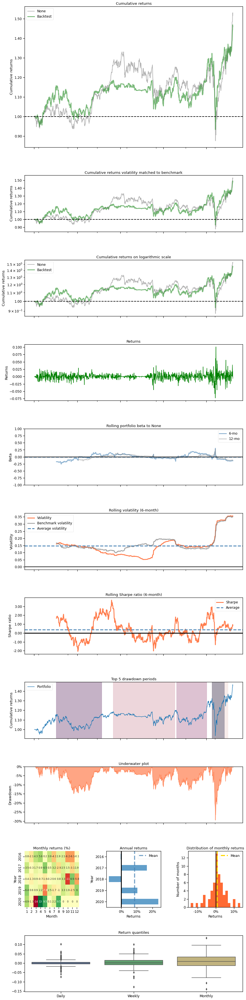

In [58]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_a2c_ver1_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [59]:
term = '(2016/01/04-2020/08/13)'
a2c_ver1_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_a2c_1':['18.735%','0%','0%','0','-0%'],
                          'kospi_a2c_2':['35.623%','0%','0%','0','-0%'],
                          'kospi_a2c_3':['53.683%','0%','0%','0','-0%'],
                          'kospi_a2c_4':['65.347%','0%','0%','0','-0%'],
                          'kospi_a2c_5':['45.906%','0%','0%','0','-0%'],
                          }
a2c_ver1_performance_evaluation = pd.DataFrame(a2c_ver1_performance_evaluation).set_index(term)
a2c_ver1_performance_evaluation.to_csv('performance/kospi_a2c_ver1_performance_evaluation_comparison.csv',index=True)
display(a2c_ver1_performance_evaluation)

,kospi_a2c_1,kospi_a2c_2,kospi_a2c_3,kospi_a2c_4,kospi_a2c_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,18.735%,35.623%,53.683%,65.347%,45.906%
Annual Return,10.577%,16.629%,15.766%,13.386%,16.307%
Annual Volatility,18.087%,17.65%,17.778%,16.524%,19.816%
Sharpe Ratio,0.65,0.96,0.91,0.84,0.86
Max Dragdown,-37.099%,-26.044%,-33.115%,-33.381%,-36.001%


In [60]:
a2c_ver1_performance_evaluation_transpose = a2c_ver1_performance_evaluation.T
a2c_ver1_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
a2c_ver1_performance_evaluation_transpose = a2c_ver1_performance_evaluation_transpose.apply(pd.to_numeric)
display(a2c_ver1_performance_evaluation_transpose)
display(a2c_ver1_performance_evaluation_transpose.dtypes)

(2016/01/04-2020/08/13),Cumulative Return,Annual Return,Annual Volatility,Sharpe Ratio,Max Dragdown
kospi_a2c_1,18.735,10.577,18.087,0.65,-37.099
kospi_a2c_2,35.623,16.629,17.650,0.96,-26.044
kospi_a2c_3,53.683,15.766,17.778,0.91,-33.115
kospi_a2c_4,65.347,13.386,16.524,0.84,-33.381
kospi_a2c_5,45.906,16.307,19.816,0.86,-36.001


(2016/01/04-2020/08/13)
Cumulative Return    float64
Annual Return        float64
Annual Volatility    float64
Sharpe Ratio         float64
Max Dragdown         float64
dtype: object

In [61]:
a2c_ver1_performance_evaluation_transpose['Cumulative Return'].mean()

43.858799999999995

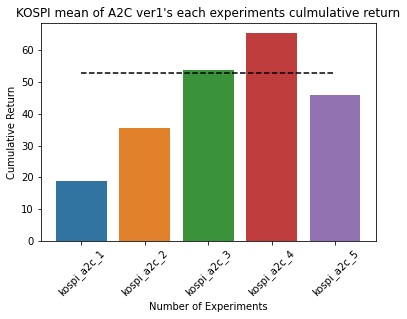

In [110]:
real_kospi = 52.946
sns.barplot(y= a2c_ver1_performance_evaluation_transpose['Cumulative Return'], x=a2c_ver1_performance_evaluation_transpose.index )
sns.lineplot(y=real_kospi,x=a2c_ver1_performance_evaluation_transpose.index,color='black',linestyle='--')
plt.title("KOSPI mean of A2C ver1's each experiments culmulative return")
plt.xlabel('Number of Experiments')
plt.ylabel('Cumulative Return')
plt.xticks(rotation=45)
plt.savefig('./performance/kospi_a2c_ver1.png',dpi=500)

### DDPG ver1 HMAX_NORMALIZE=10 & Hold Range = 0 to 3 with int share

In [72]:
kospi_ddpg_ver1_1_account_value = get_account_value(63, 63, 'kospi', 'ddpg_HMAX_NORMALIZE10_hold0to3', 'ddpg', 1)
kospi_ddpg_ver1_2_account_value = get_account_value(63, 63, 'kospi', 'ddpg_HMAX_NORMALIZE10_hold0to3', 'ddpg', 2)
kospi_ddpg_ver1_3_account_value = get_account_value(63, 63, 'kospi', 'ddpg_HMAX_NORMALIZE10_hold0to3', 'ddpg', 3)
kospi_ddpg_ver1_4_account_value = get_account_value(63, 63, 'kospi', 'ddpg_HMAX_NORMALIZE10_hold0to3', 'ddpg', 4)
kospi_ddpg_ver1_5_account_value = get_account_value(63, 63, 'kospi', 'ddpg_HMAX_NORMALIZE10_hold0to3', 'ddpg', 5)

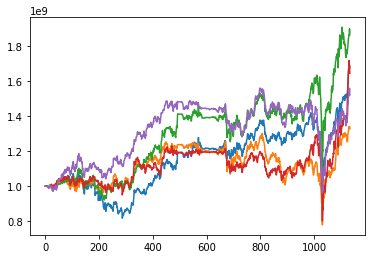

In [73]:
kospi_ddpg_ver1_1_account_value.account_value.plot()
kospi_ddpg_ver1_2_account_value.account_value.plot()
kospi_ddpg_ver1_3_account_value.account_value.plot()
kospi_ddpg_ver1_4_account_value.account_value.plot()
kospi_ddpg_ver1_5_account_value.account_value.plot()

In [81]:
kospi_ddpg_ver1_1_account_value = get_daily_return(kospi_ddpg_ver1_1_account_value)
kospi_ddpg_ver1_2_account_value = get_daily_return(kospi_ddpg_ver1_2_account_value)
kospi_ddpg_ver1_3_account_value = get_daily_return(kospi_ddpg_ver1_3_account_value)
kospi_ddpg_ver1_4_account_value = get_daily_return(kospi_ddpg_ver1_4_account_value)
kospi_ddpg_ver1_5_account_value = get_daily_return(kospi_ddpg_ver1_5_account_value)

In [82]:
kospi_ddpg_ver1_1_account_value['Date'] = test_kospi['Date']
kospi_ddpg_ver1_2_account_value['Date'] = test_kospi['Date']
kospi_ddpg_ver1_3_account_value['Date'] = test_kospi['Date']
kospi_ddpg_ver1_4_account_value['Date'] = test_kospi['Date']
kospi_ddpg_ver1_5_account_value['Date'] = test_kospi['Date']

In [83]:
kospi_ddpg_ver1_1_strat = backtest_strat(kospi_ddpg_ver1_1_account_value)
kospi_ddpg_ver1_2_strat = backtest_strat(kospi_ddpg_ver1_2_account_value)
kospi_ddpg_ver1_3_strat = backtest_strat(kospi_ddpg_ver1_3_account_value)
kospi_ddpg_ver1_4_strat = backtest_strat(kospi_ddpg_ver1_4_account_value)
kospi_ddpg_ver1_5_strat = backtest_strat(kospi_ddpg_ver1_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,9.749%
Cumulative returns,51.989%
Annual volatility,17.601%
Sharpe ratio,0.62
Calmar ratio,0.25
Stability,0.46
Max drawdown,-38.428%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,38.43,2019-04-10,2020-03-18,NaT,NaN
1,13.84,2018-03-15,2018-12-28,2019-03-15,262
2,12.10,2016-07-06,2016-12-01,2017-03-28,190
3,5.02,2016-06-08,2016-06-16,2016-06-29,16
4,4.24,2016-05-04,2016-05-23,2016-06-01,21


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


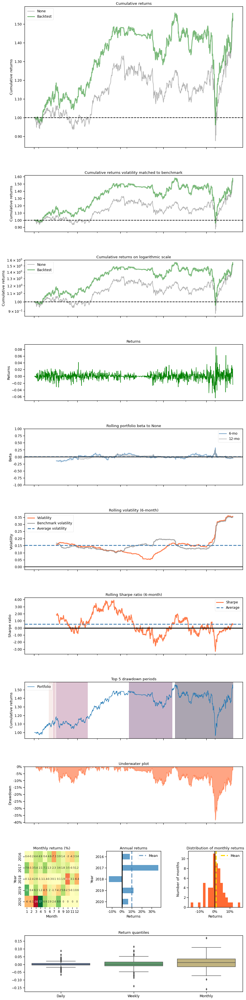

In [142]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ddpg_ver1_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [91]:
term = '(2016/01/04-2020/08/13)'
ddpg_ver1_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_ddpg_1':['67.375%','0%','0%','0','-0%'],
                          'kospi_ddpg_2':['32.835%','0%','0%','0','-0%'],
                          'kospi_ddpg_3':['86.469%','0%','0%','0','-0%'],
                          'kospi_ddpg_4':['64.38%','0%','0%','0','-0%'],
                          'kospi_ddpg_5':['51.989%','0%','0%','0','-0%'],
                          }
ddpg_ver1_performance_evaluation = pd.DataFrame(ddpg_ver1_performance_evaluation).set_index(term)
ddpg_ver1_performance_evaluation.to_csv('performance/kospi_ddpg_ver1_performance_evaluation_comparison.csv',index=True)
display(ddpg_ver1_performance_evaluation)

,kospi_ddpg_1,kospi_ddpg_2,kospi_ddpg_3,kospi_ddpg_4,kospi_ddpg_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,67.375%,32.835%,86.469%,64.38%,51.989%
Annual Return,0%,0%,0%,0%,0%
Annual Volatility,0%,0%,0%,0%,0%
Sharpe Ratio,0,0,0,0,0
Max Dragdown,-0%,-0%,-0%,-0%,-0%


In [92]:
ddpg_ver1_performance_evaluation_transpose = ddpg_ver1_performance_evaluation.T
ddpg_ver1_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
ddpg_ver1_performance_evaluation_transpose = ddpg_ver1_performance_evaluation_transpose.apply(pd.to_numeric)
display(ddpg_ver1_performance_evaluation_transpose)
display(ddpg_ver1_performance_evaluation_transpose.dtypes)

(2016/01/04-2020/08/13),Cumulative Return,Annual Return,Annual Volatility,Sharpe Ratio,Max Dragdown
kospi_ddpg_1,67.375,0,0,0,0
kospi_ddpg_2,32.835,0,0,0,0
kospi_ddpg_3,86.469,0,0,0,0
kospi_ddpg_4,64.380,0,0,0,0
kospi_ddpg_5,51.989,0,0,0,0


(2016/01/04-2020/08/13)
Cumulative Return    float64
Annual Return          int64
Annual Volatility      int64
Sharpe Ratio           int64
Max Dragdown           int64
dtype: object

In [93]:
ddpg_ver1_performance_evaluation_transpose['Cumulative Return'].mean()

60.6096

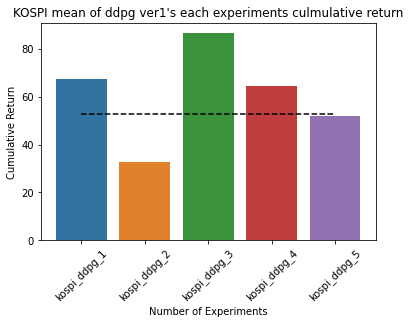

In [109]:
real_kospi = 52.946
sns.barplot(y= ddpg_ver1_performance_evaluation_transpose['Cumulative Return'], x=ddpg_ver1_performance_evaluation_transpose.index )
sns.lineplot(y=real_kospi,x=ddpg_ver1_performance_evaluation_transpose.index,color='black',linestyle='--')
plt.title("KOSPI mean of ddpg ver1's each experiments culmulative return")
plt.xlabel('Number of Experiments')
plt.ylabel('Cumulative Return')
plt.xticks(rotation=45)
plt.savefig('./performance/kospi_ddpg_ver1.png',dpi=500)

### Remake ver1 HMAX_NORMALIZE=10 & Hold Range = 0 to 3 with int share

In [79]:
kospi_remake_ver1_1_account_value = get_account_value(63, 63, 'kospi', 'remake_HMAX_NORMALIZE10_hold0to3', 'remake_ensemble', 1)
kospi_remake_ver1_2_account_value = get_account_value(63, 63, 'kospi', 'remake_HMAX_NORMALIZE10_hold0to3', 'remake_ensemble', 2)
kospi_remake_ver1_3_account_value = get_account_value(63, 63, 'kospi', 'remake_HMAX_NORMALIZE10_hold0to3', 'remake_ensemble', 3)
kospi_remake_ver1_4_account_value = get_account_value(63, 63, 'kospi', 'remake_HMAX_NORMALIZE10_hold0to3', 'remake_ensemble', 4)
kospi_remake_ver1_5_account_value = get_account_value(63, 63, 'kospi', 'remake_HMAX_NORMALIZE10_hold0to3', 'remake_ensemble', 5)

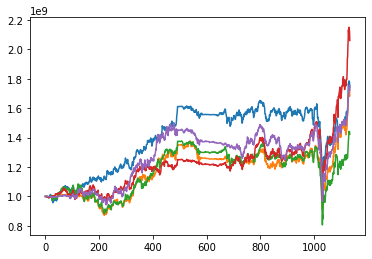

In [80]:
kospi_remake_ver1_1_account_value.account_value.plot()
kospi_remake_ver1_2_account_value.account_value.plot()
kospi_remake_ver1_3_account_value.account_value.plot()
kospi_remake_ver1_4_account_value.account_value.plot()
kospi_remake_ver1_5_account_value.account_value.plot()

In [96]:
kospi_remake_ver1_1_account_value = get_daily_return(kospi_remake_ver1_1_account_value)
kospi_remake_ver1_2_account_value = get_daily_return(kospi_remake_ver1_2_account_value)
kospi_remake_ver1_3_account_value = get_daily_return(kospi_remake_ver1_3_account_value)
kospi_remake_ver1_4_account_value = get_daily_return(kospi_remake_ver1_4_account_value)
kospi_remake_ver1_5_account_value = get_daily_return(kospi_remake_ver1_5_account_value)

In [97]:
kospi_remake_ver1_1_account_value['Date'] = test_kospi['Date']
kospi_remake_ver1_2_account_value['Date'] = test_kospi['Date']
kospi_remake_ver1_3_account_value['Date'] = test_kospi['Date']
kospi_remake_ver1_4_account_value['Date'] = test_kospi['Date']
kospi_remake_ver1_5_account_value['Date'] = test_kospi['Date']

In [98]:
kospi_remake_ver1_1_strat = backtest_strat(kospi_remake_ver1_1_account_value)
kospi_remake_ver1_2_strat = backtest_strat(kospi_remake_ver1_2_account_value)
kospi_remake_ver1_3_strat = backtest_strat(kospi_remake_ver1_3_account_value)
kospi_remake_ver1_4_strat = backtest_strat(kospi_remake_ver1_4_account_value)
kospi_remake_ver1_5_strat = backtest_strat(kospi_remake_ver1_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,12.875%
Cumulative returns,72.461%
Annual volatility,18.263%
Sharpe ratio,0.76
Calmar ratio,0.36
Stability,0.57
Max drawdown,-35.464%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,35.46,2017-12-12,2020-03-18,2020-07-03,669
1,10.66,2016-07-15,2016-12-02,2017-01-18,134
2,7.59,2017-06-13,2017-06-21,2017-08-04,39
3,6.67,2017-01-19,2017-02-28,2017-03-30,51
4,4.14,2017-11-07,2017-11-14,2017-11-20,10


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


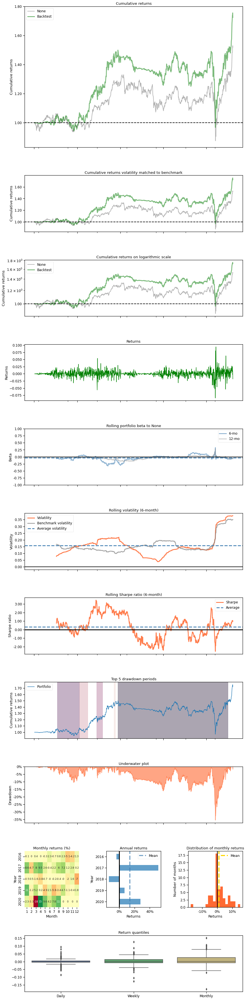

In [103]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_remake_ver1_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [104]:
term = '(2016/01/04-2020/08/13)'
remake_ver1_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_remake_1':['73.989%','0%','0%','0','-0%'],
                          'kospi_remake_2':['68.474%','0%','0%','0','-0%'],
                          'kospi_remake_3':['42.38%','0%','0%','0','-0%'],
                          'kospi_remake_4':['106.056%','0%','0%','0','-0%'],
                          'kospi_remake_5':['72.467%','0%','0%','0','-0%'],
                          }
remake_ver1_performance_evaluation = pd.DataFrame(remake_ver1_performance_evaluation).set_index(term)
remake_ver1_performance_evaluation.to_csv('performance/kospi_remake_ver1_performance_evaluation_comparison.csv',index=True)
display(remake_ver1_performance_evaluation)

,kospi_remake_1,kospi_remake_2,kospi_remake_3,kospi_remake_4,kospi_remake_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,73.989%,68.474%,42.38%,106.056%,72.467%
Annual Return,0%,0%,0%,0%,0%
Annual Volatility,0%,0%,0%,0%,0%
Sharpe Ratio,0,0,0,0,0
Max Dragdown,-0%,-0%,-0%,-0%,-0%


In [105]:
remake_ver1_performance_evaluation_transpose = remake_ver1_performance_evaluation.T
remake_ver1_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
remake_ver1_performance_evaluation_transpose = remake_ver1_performance_evaluation_transpose.apply(pd.to_numeric)
display(remake_ver1_performance_evaluation_transpose)
display(remake_ver1_performance_evaluation_transpose.dtypes)

(2016/01/04-2020/08/13),Cumulative Return,Annual Return,Annual Volatility,Sharpe Ratio,Max Dragdown
kospi_remake_1,73.989,0,0,0,0
kospi_remake_2,68.474,0,0,0,0
kospi_remake_3,42.380,0,0,0,0
kospi_remake_4,106.056,0,0,0,0
kospi_remake_5,72.467,0,0,0,0


(2016/01/04-2020/08/13)
Cumulative Return    float64
Annual Return          int64
Annual Volatility      int64
Sharpe Ratio           int64
Max Dragdown           int64
dtype: object

In [106]:
remake_ver1_performance_evaluation_transpose['Cumulative Return'].mean()

72.67319999999998

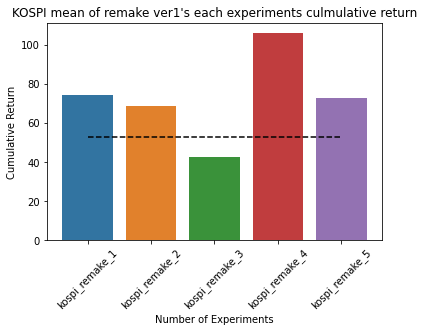

In [108]:
real_kospi = 52.946
sns.barplot(y= remake_ver1_performance_evaluation_transpose['Cumulative Return'], x=remake_ver1_performance_evaluation_transpose.index , )
sns.lineplot(y=real_kospi,x=remake_ver1_performance_evaluation_transpose.index,color='black',linestyle='--')
plt.title("KOSPI mean of remake ver1's each experiments culmulative return")
plt.xlabel('Number of Experiments')
plt.ylabel('Cumulative Return')
plt.xticks(rotation=45)
plt.savefig('./performance/kospi_remake_ver1.png',dpi=500)

## PPO

In [36]:
kospi_ppo_1_account_value = get_account_value(63, 63, 'kospi', 'ppo', 'PPO', 1)
kospi_ppo_2_account_value = get_account_value(63, 63, 'kospi', 'ppo', 'PPO', 2)
kospi_ppo_3_account_value = get_account_value(63, 63, 'kospi', 'ppo', 'PPO', 3)
kospi_ppo_4_account_value = get_account_value(63, 63, 'kospi', 'ppo', 'PPO', 4)
kospi_ppo_5_account_value = get_account_value(63, 63, 'kospi', 'ppo', 'PPO', 5)
display(kospi_ppo_1_account_value)

,account_value,datadate
0,1.000000e+09,20160104
1,1.000438e+09,20160105
2,9.967334e+08,20160106
3,9.989985e+08,20160107
4,9.969862e+08,20160108
...,...,...
1129,1.486734e+09,20200807
1130,1.504051e+09,20200810
1131,1.492731e+09,20200811
1132,1.505668e+09,20200812


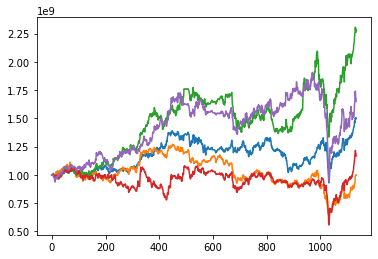

In [37]:
kospi_ppo_1_account_value.account_value.plot()
kospi_ppo_2_account_value.account_value.plot()
kospi_ppo_3_account_value.account_value.plot()
kospi_ppo_4_account_value.account_value.plot()
kospi_ppo_5_account_value.account_value.plot()

In [38]:
kospi_ppo_1_account_value = get_daily_return(kospi_ppo_1_account_value)
kospi_ppo_2_account_value = get_daily_return(kospi_ppo_2_account_value)
kospi_ppo_3_account_value = get_daily_return(kospi_ppo_3_account_value)
kospi_ppo_4_account_value = get_daily_return(kospi_ppo_4_account_value)
kospi_ppo_5_account_value = get_daily_return(kospi_ppo_5_account_value)

In [39]:
kospi_ppo_1_account_value['Date'] = test_kospi['Date']
kospi_ppo_2_account_value['Date'] = test_kospi['Date']
kospi_ppo_3_account_value['Date'] = test_kospi['Date']
kospi_ppo_4_account_value['Date'] = test_kospi['Date']
kospi_ppo_5_account_value['Date'] = test_kospi['Date']
#display(kospi_ppo_1_account_value)

In [40]:
kospi_ppo_1_strat = backtest_strat(kospi_ppo_1_account_value)
kospi_ppo_2_strat = backtest_strat(kospi_ppo_2_account_value)
kospi_ppo_3_strat = backtest_strat(kospi_ppo_3_account_value)
kospi_ppo_4_strat = backtest_strat(kospi_ppo_4_account_value)
kospi_ppo_5_strat = backtest_strat(kospi_ppo_5_account_value)
#display(pd.DataFrame(kospi_ppo_1_strat))

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,11.766%
Cumulative returns,64.966%
Annual volatility,23.964%
Sharpe ratio,0.58
Calmar ratio,0.23
Stability,0.57
Max drawdown,-50.739%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,50.74,2019-12-17,2020-03-18,NaT,NaN
1,21.24,2017-12-13,2018-10-31,2019-07-25,422
2,14.21,2016-09-26,2016-11-23,2017-02-03,95
3,7.19,2019-09-23,2019-10-25,2019-11-14,39
4,6.81,2016-01-07,2016-01-20,2016-02-03,20


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


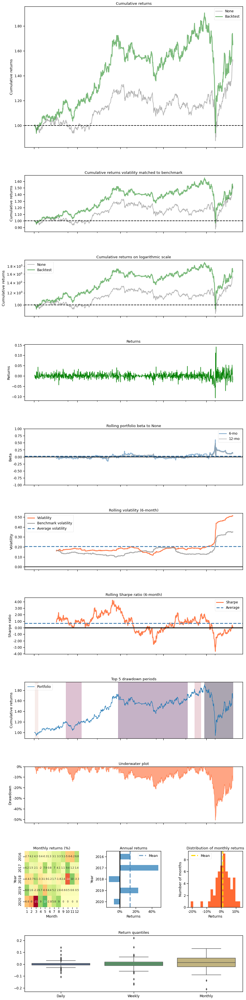

In [41]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ppo_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [42]:
ppo_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_ppo_1':['49.778%','9.393%','19.317%','0.56','-33.039%'],
                          'kospi_ppo_2':['-0.103%','-0.023%','21.256%','0.11','-51.949%'],
                          'kospi_ppo_3':['126.344%','19.905%','21.333%','0.96','-36.326%'],
                          'kospi_ppo_4':['16.629%','3.478%','24.107%','0.26','-48.474%'],
                          'kospi_ppo_5':['64.966%','11.766%','23.964%','0.58','-50.739%'],
                          }
ppo_performance_evaluation = pd.DataFrame(ppo_performance_evaluation).set_index(term)
ppo_performance_evaluation.to_csv('performance/kospi_ppo_performance_evaluation_comparison.csv',index=True)
display(ppo_performance_evaluation)

,kospi_ppo_1,kospi_ppo_2,kospi_ppo_3,kospi_ppo_4,kospi_ppo_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,49.778%,-0.103%,126.344%,16.629%,64.966%
Annual Return,9.393%,-0.023%,19.905%,3.478%,11.766%
Annual Volatility,19.317%,21.256%,21.333%,24.107%,23.964%
Sharpe Ratio,0.56,0.11,0.96,0.26,0.58
Max Dragdown,-33.039%,-51.949%,-36.326%,-48.474%,-50.739%


In [43]:
ppo_performance_evaluation_transpose = ppo_performance_evaluation.T
ppo_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
ppo_performance_evaluation_transpose = ppo_performance_evaluation_transpose.apply(pd.to_numeric)
display(ppo_performance_evaluation_transpose)
display(ppo_performance_evaluation_transpose.dtypes)

(2016/01/04-2020/08/13),Cumulative Return,Annual Return,Annual Volatility,Sharpe Ratio,Max Dragdown
kospi_ppo_1,49.778,9.393,19.317,0.56,-33.039
kospi_ppo_2,-0.103,-0.023,21.256,0.11,-51.949
kospi_ppo_3,126.344,19.905,21.333,0.96,-36.326
kospi_ppo_4,16.629,3.478,24.107,0.26,-48.474
kospi_ppo_5,64.966,11.766,23.964,0.58,-50.739


(2016/01/04-2020/08/13)
Cumulative Return    float64
Annual Return        float64
Annual Volatility    float64
Sharpe Ratio         float64
Max Dragdown         float64
dtype: object

In [44]:
ppo_performance_evaluation_transpose['Cumulative Return'].mean()
#ensemble_performance_evaluation_transpose['Annual Return'].mean()
#ensemble_performance_evaluation_transpose['Annual Volatility'].mean()
#ensemble_performance_evaluation_transpose['Sharpe Ratio'].mean()
#ensemble_performance_evaluation_transpose['Max Dragdown'].mean()

51.522800000000004

### ppo practice

In [53]:
kospi_ppo_practice_1_account_value = get_account_value(63, 63, 'kospi', 'ppo_practice', 'PPO', 1)
kospi_ppo_practice_2_account_value = get_account_value(63, 63, 'kospi', 'ppo_practice', 'PPO', 2)
kospi_ppo_practice_3_account_value = get_account_value(63, 63, 'kospi', 'ppo_practice', 'PPO', 3)
kospi_ppo_practice_4_account_value = get_account_value(63, 63, 'kospi', 'ppo_practice', 'PPO', 4)
kospi_ppo_practice_5_account_value = get_account_value(63, 63, 'kospi', 'ppo_practice', 'PPO', 5)

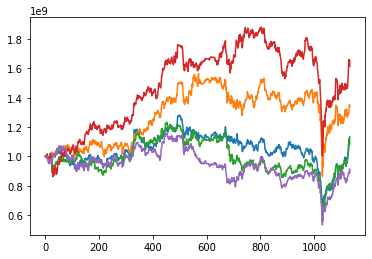

In [54]:
kospi_ppo_practice_1_account_value.account_value.plot()
kospi_ppo_practice_2_account_value.account_value.plot()
kospi_ppo_practice_3_account_value.account_value.plot()
kospi_ppo_practice_4_account_value.account_value.plot()
kospi_ppo_practice_5_account_value.account_value.plot()

In [55]:
kospi_ppo_practice_1_account_value = get_daily_return(kospi_ppo_practice_1_account_value)
kospi_ppo_practice_2_account_value = get_daily_return(kospi_ppo_practice_2_account_value)
kospi_ppo_practice_3_account_value = get_daily_return(kospi_ppo_practice_3_account_value)
kospi_ppo_practice_4_account_value = get_daily_return(kospi_ppo_practice_4_account_value)
kospi_ppo_practice_5_account_value = get_daily_return(kospi_ppo_practice_5_account_value)

In [56]:
kospi_ppo_practice_1_account_value['Date'] = test_kospi['Date']
kospi_ppo_practice_2_account_value['Date'] = test_kospi['Date']
kospi_ppo_practice_3_account_value['Date'] = test_kospi['Date']
kospi_ppo_practice_4_account_value['Date'] = test_kospi['Date']
kospi_ppo_practice_5_account_value['Date'] = test_kospi['Date']

In [59]:
kospi_ppo_practice_1_strat = backtest_strat(kospi_ppo_practice_1_account_value)
kospi_ppo_practice_2_strat = backtest_strat(kospi_ppo_practice_2_account_value)
kospi_ppo_practice_3_strat = backtest_strat(kospi_ppo_practice_3_account_value)
kospi_ppo_practice_4_strat = backtest_strat(kospi_ppo_practice_4_account_value)
kospi_ppo_practice_5_strat = backtest_strat(kospi_ppo_practice_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,-2.51%
Cumulative returns,-10.81%
Annual volatility,20.832%
Sharpe ratio,-0.02
Calmar ratio,-0.05
Stability,0.42
Max drawdown,-53.884%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,53.88,2017-11-02,2020-03-18,NaT,NaN
1,16.11,2016-03-21,2016-06-27,2017-05-18,304
2,11.26,2017-05-26,2017-09-22,2017-10-13,101
3,5.17,2016-01-12,2016-01-25,2016-02-16,26
4,1.88,2016-02-18,2016-02-24,2016-03-02,10


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


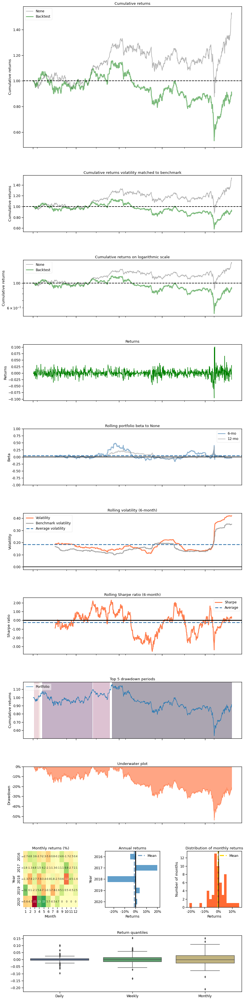

In [60]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ppo_practice_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

### PPO sell penalty sigmoid with int share

In [85]:
kospi_ppo_sell_penalty_sigmoid_1_account_value = get_account_value(63, 63, 'kospi', 'ppo_sell_penalty_sigmoid', 'PPO', 1)
kospi_ppo_sell_penalty_sigmoid_2_account_value = get_account_value(63, 63, 'kospi', 'ppo_sell_penalty_sigmoid', 'PPO', 2)
kospi_ppo_sell_penalty_sigmoid_3_account_value = get_account_value(63, 63, 'kospi', 'ppo_sell_penalty_sigmoid', 'PPO', 3)
kospi_ppo_sell_penalty_sigmoid_4_account_value = get_account_value(63, 63, 'kospi', 'ppo_sell_penalty_sigmoid', 'PPO', 4)
kospi_ppo_sell_penalty_sigmoid_5_account_value = get_account_value(63, 63, 'kospi', 'ppo_sell_penalty_sigmoid', 'PPO', 5)

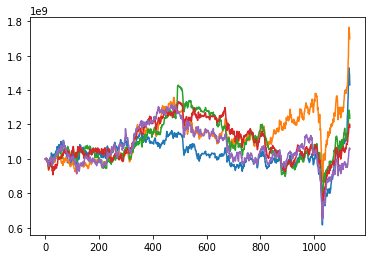

In [86]:
kospi_ppo_sell_penalty_sigmoid_1_account_value.account_value.plot()
kospi_ppo_sell_penalty_sigmoid_2_account_value.account_value.plot()
kospi_ppo_sell_penalty_sigmoid_3_account_value.account_value.plot()
kospi_ppo_sell_penalty_sigmoid_4_account_value.account_value.plot()
kospi_ppo_sell_penalty_sigmoid_5_account_value.account_value.plot()

In [87]:
kospi_ppo_sell_penalty_sigmoid_1_account_value = get_daily_return(kospi_ppo_sell_penalty_sigmoid_1_account_value)
kospi_ppo_sell_penalty_sigmoid_2_account_value = get_daily_return(kospi_ppo_sell_penalty_sigmoid_2_account_value)
kospi_ppo_sell_penalty_sigmoid_3_account_value = get_daily_return(kospi_ppo_sell_penalty_sigmoid_3_account_value)
kospi_ppo_sell_penalty_sigmoid_4_account_value = get_daily_return(kospi_ppo_sell_penalty_sigmoid_4_account_value)
kospi_ppo_sell_penalty_sigmoid_5_account_value = get_daily_return(kospi_ppo_sell_penalty_sigmoid_5_account_value)

In [88]:
kospi_ppo_sell_penalty_sigmoid_1_account_value['Date'] = test_kospi['Date']
kospi_ppo_sell_penalty_sigmoid_2_account_value['Date'] = test_kospi['Date']
kospi_ppo_sell_penalty_sigmoid_3_account_value['Date'] = test_kospi['Date']
kospi_ppo_sell_penalty_sigmoid_4_account_value['Date'] = test_kospi['Date']
kospi_ppo_sell_penalty_sigmoid_5_account_value['Date'] = test_kospi['Date']

In [89]:
kospi_ppo_sell_penalty_sigmoid_1_strat = backtest_strat(kospi_ppo_sell_penalty_sigmoid_1_account_value)
kospi_ppo_sell_penalty_sigmoid_2_strat = backtest_strat(kospi_ppo_sell_penalty_sigmoid_2_account_value)
kospi_ppo_sell_penalty_sigmoid_3_strat = backtest_strat(kospi_ppo_sell_penalty_sigmoid_3_account_value)
kospi_ppo_sell_penalty_sigmoid_4_strat = backtest_strat(kospi_ppo_sell_penalty_sigmoid_4_account_value)
kospi_ppo_sell_penalty_sigmoid_5_strat = backtest_strat(kospi_ppo_sell_penalty_sigmoid_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,1.236%
Cumulative returns,5.684%
Annual volatility,20.293%
Sharpe ratio,0.16
Calmar ratio,0.02
Stability,0.06
Max drawdown,-51.099%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,51.10,2017-12-01,2020-03-18,NaT,NaN
1,17.36,2016-04-12,2016-06-24,2017-03-17,244
2,12.46,2017-03-20,2017-04-18,2017-05-22,46
3,4.72,2016-01-29,2016-02-11,2016-02-29,22
4,4.43,2016-01-12,2016-01-20,2016-01-28,13


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


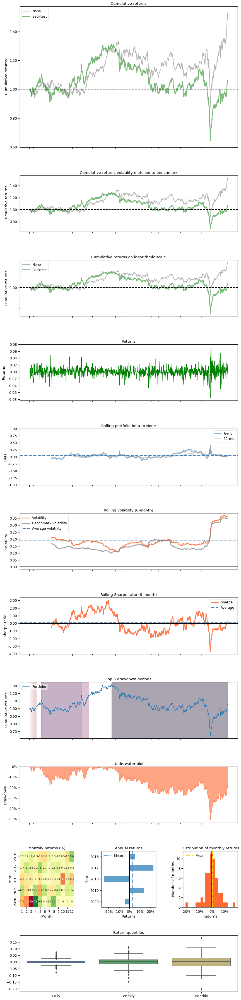

In [90]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ppo_sell_penalty_sigmoid_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

### PPO ver1 HMAX_NORMALIZE=10 & Hold Range = -2 to 2 with int share

In [34]:
kospi_ppo_ver1_1_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold-2to2', 'PPO', 1)
kospi_ppo_ver1_2_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold-2to2', 'PPO', 2)
kospi_ppo_ver1_3_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold-2to2', 'PPO', 3)
kospi_ppo_ver1_4_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold-2to2', 'PPO', 4)
kospi_ppo_ver1_5_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold-2to2', 'PPO', 5)

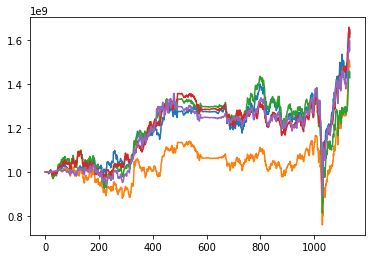

In [35]:
kospi_ppo_ver1_1_account_value.account_value.plot()
kospi_ppo_ver1_2_account_value.account_value.plot()
kospi_ppo_ver1_3_account_value.account_value.plot()
kospi_ppo_ver1_4_account_value.account_value.plot()
kospi_ppo_ver1_5_account_value.account_value.plot()

In [36]:
kospi_ppo_ver1_1_account_value = get_daily_return(kospi_ppo_ver1_1_account_value)
kospi_ppo_ver1_2_account_value = get_daily_return(kospi_ppo_ver1_2_account_value)
kospi_ppo_ver1_3_account_value = get_daily_return(kospi_ppo_ver1_3_account_value)
kospi_ppo_ver1_4_account_value = get_daily_return(kospi_ppo_ver1_4_account_value)
kospi_ppo_ver1_5_account_value = get_daily_return(kospi_ppo_ver1_5_account_value)

In [37]:
kospi_ppo_ver1_1_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver1_2_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver1_3_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver1_4_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver1_5_account_value['Date'] = test_kospi['Date']

In [38]:
kospi_ppo_ver1_1_strat = backtest_strat(kospi_ppo_ver1_1_account_value)
kospi_ppo_ver1_2_strat = backtest_strat(kospi_ppo_ver1_2_account_value)
kospi_ppo_ver1_3_strat = backtest_strat(kospi_ppo_ver1_3_account_value)
kospi_ppo_ver1_4_strat = backtest_strat(kospi_ppo_ver1_4_account_value)
kospi_ppo_ver1_5_strat = backtest_strat(kospi_ppo_ver1_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,10.284%
Cumulative returns,55.351%
Annual volatility,17.067%
Sharpe ratio,0.66
Calmar ratio,0.29
Stability,0.60
Max drawdown,-35.691%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,35.69,2020-02-18,2020-03-18,2020-06-02,76
1,12.60,2017-12-14,2019-10-02,2020-02-10,563
2,8.85,2016-09-26,2016-12-01,2017-04-13,144
3,7.45,2020-06-09,2020-06-12,2020-06-22,10
4,5.59,2020-07-03,2020-07-24,2020-08-04,23


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


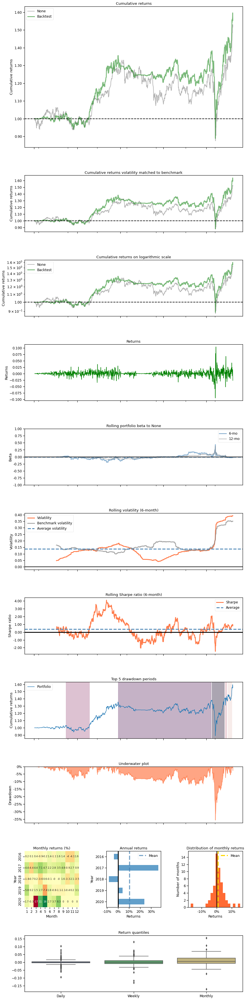

In [39]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ppo_ver1_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

### PPO ver2 HMAX_NORMALIZE=10 & Hold Range = 0 to 3 with int share

In [14]:
kospi_ppo_ver2_1_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold0to3', 'PPO', 1)
kospi_ppo_ver2_2_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold0to3', 'PPO', 2)
kospi_ppo_ver2_3_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold0to3', 'PPO', 3)
kospi_ppo_ver2_4_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold0to3', 'PPO', 4)
kospi_ppo_ver2_5_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold0to3', 'PPO', 5)

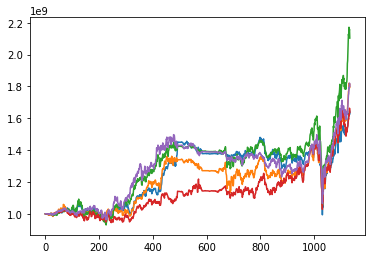

In [15]:
kospi_ppo_ver2_1_account_value.account_value.plot()
kospi_ppo_ver2_2_account_value.account_value.plot()
kospi_ppo_ver2_3_account_value.account_value.plot()
kospi_ppo_ver2_4_account_value.account_value.plot()
kospi_ppo_ver2_5_account_value.account_value.plot()

In [175]:
kospi30 = test_kospi[:1134]
kospi30['cr'] = kospi30['Close'].apply(lambda x: x/kospi30['Close'][0])

/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [132]:
kospi_ppo_ver2_1_account_value['cr'] = kospi_ppo_ver2_1_account_value['account_value'].apply(lambda x: x/ kospi_ppo_ver2_1_account_value['account_value'][0])
kospi_ppo_ver2_2_account_value['cr'] = kospi_ppo_ver2_2_account_value['account_value'].apply(lambda x: x/ kospi_ppo_ver2_2_account_value['account_value'][0])
kospi_ppo_ver2_3_account_value['cr'] = kospi_ppo_ver2_3_account_value['account_value'].apply(lambda x: x/ kospi_ppo_ver2_3_account_value['account_value'][0])
kospi_ppo_ver2_4_account_value['cr'] = kospi_ppo_ver2_4_account_value['account_value'].apply(lambda x: x/ kospi_ppo_ver2_4_account_value['account_value'][0])
kospi_ppo_ver2_5_account_value['cr'] = kospi_ppo_ver2_5_account_value['account_value'].apply(lambda x: x/ kospi_ppo_ver2_5_account_value['account_value'][0])

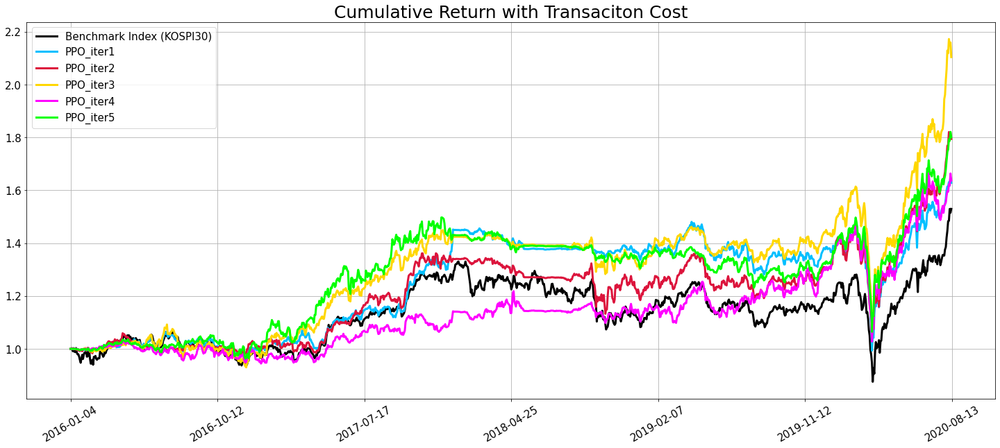

In [187]:
from matplotlib.ticker import MaxNLocator
fig, ax = plt.subplots(figsize=(25,10))
ax.xaxis.set_major_locator(MaxNLocator(8)) 
ax.plot(kospi30['Date'], kospi30['cr'],label= 'Benchmark Index (KOSPI30)',linestyle='solid',dash_capstyle='round',linewidth=3,
       color='Black')
ax.plot(kospi_ppo_ver2_1_account_value.cr, label='PPO_iter1',dash_capstyle='round',linewidth=3,color='DeepSkyBlue')
ax.plot(kospi_ppo_ver2_2_account_value.cr, label='PPO_iter2',dash_capstyle='round',linewidth=3,color='Crimson')
ax.plot(kospi_ppo_ver2_3_account_value.cr, label='PPO_iter3',dash_capstyle='round',linewidth=3,color='Gold')
ax.plot(kospi_ppo_ver2_4_account_value.cr, label='PPO_iter4',dash_capstyle='round',linewidth=3,color='Magenta')
ax.plot(kospi_ppo_ver2_5_account_value.cr, label='PPO_iter5',dash_capstyle='round',linewidth=3,color='Lime')
plt.xticks(range(0,1135,189), [kospi30['Date'][x] for x in range(0,1134,189)]+['2020-08-13'],rotation=30, fontsize=15)
plt.yticks(fontsize=15)
plt.grid(True)
plt.title('Cumulative Return with Transaciton Cost',fontsize=25)
plt.legend(loc='best',fontsize=15)
plt.savefig('./performance/kopsi_ppo_plot.png',dpi=500)
plt.show()

In [16]:
kospi_ppo_ver2_1_account_value = get_daily_return(kospi_ppo_ver2_1_account_value)
kospi_ppo_ver2_2_account_value = get_daily_return(kospi_ppo_ver2_2_account_value)
kospi_ppo_ver2_3_account_value = get_daily_return(kospi_ppo_ver2_3_account_value)
kospi_ppo_ver2_4_account_value = get_daily_return(kospi_ppo_ver2_4_account_value)
kospi_ppo_ver2_5_account_value = get_daily_return(kospi_ppo_ver2_5_account_value)

In [17]:
kospi_ppo_ver2_1_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver2_2_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver2_3_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver2_4_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver2_5_account_value['Date'] = test_kospi['Date']

In [18]:
kospi_ppo_ver2_1_strat = backtest_strat(kospi_ppo_ver2_1_account_value)
kospi_ppo_ver2_2_strat = backtest_strat(kospi_ppo_ver2_2_account_value)
kospi_ppo_ver2_3_strat = backtest_strat(kospi_ppo_ver2_3_account_value)
kospi_ppo_ver2_4_strat = backtest_strat(kospi_ppo_ver2_4_account_value)
kospi_ppo_ver2_5_strat = backtest_strat(kospi_ppo_ver2_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,13.966%
Cumulative returns,80.092%
Annual volatility,17.47%
Sharpe ratio,0.84
Calmar ratio,0.48
Stability,0.61
Max drawdown,-28.894%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,28.89,2017-12-12,2020-03-18,2020-05-22,639
1,8.45,2016-09-28,2016-12-01,2017-01-11,76
2,8.03,2017-06-09,2017-06-21,2017-08-04,41
3,7.72,2017-01-19,2017-02-28,2017-03-30,51
4,7.09,2020-07-03,2020-07-23,2020-08-05,24


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


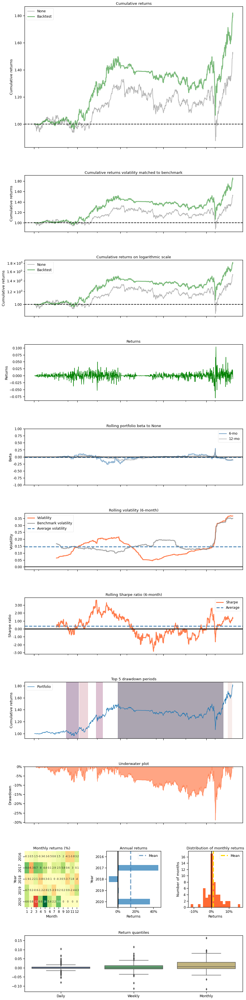

In [115]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ppo_ver2_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [119]:
term = '(2016/01/04-2020/08/13)'
ppo_ver2_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_ppo_1':['62.823%','11.442%','15.308%','0.78','-32.893%'],
                          'kospi_ppo_2':['79.415%','13.871%','16.949%','0.85','-28.28%'],
                          'kospi_ppo_3':['110.387%','17.973%','18.389%','0.99','-34.582%'],
                          'kospi_ppo_4':['63.718%','11.578%','17.614%','0.71','-29.853%'],
                          'kospi_ppo_5':['80.092%','13.966%','17.47%','0.84','-28.894%'],
                          }
ppo_ver2_performance_evaluation = pd.DataFrame(ppo_ver2_performance_evaluation).set_index(term)
ppo_ver2_performance_evaluation.to_csv('performance/kospi_ppo_ver2_performance_evaluation_comparison.csv',index=True)
display(ppo_ver2_performance_evaluation)

,kospi_ppo_1,kospi_ppo_2,kospi_ppo_3,kospi_ppo_4,kospi_ppo_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,62.823%,79.415%,110.387%,63.718%,80.092%
Annual Return,11.442%,13.871%,17.973%,11.578%,13.966%
Annual Volatility,15.308%,16.949%,18.389%,17.614%,17.47%
Sharpe Ratio,0.78,0.85,0.99,0.71,0.84
Max Dragdown,-32.893%,-28.28%,-34.582%,-29.853%,-28.894%


In [120]:
ppo_ver2_performance_evaluation_transpose = ppo_ver2_performance_evaluation.T
ppo_ver2_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
ppo_ver2_performance_evaluation_transpose = ppo_ver2_performance_evaluation_transpose.apply(pd.to_numeric)
display(ppo_ver2_performance_evaluation_transpose)
display(ppo_ver2_performance_evaluation_transpose.dtypes)

(2016/01/04-2020/08/13),Cumulative Return,Annual Return,Annual Volatility,Sharpe Ratio,Max Dragdown
kospi_ppo_1,62.823,11.442,15.308,0.78,-32.893
kospi_ppo_2,79.415,13.871,16.949,0.85,-28.280
kospi_ppo_3,110.387,17.973,18.389,0.99,-34.582
kospi_ppo_4,63.718,11.578,17.614,0.71,-29.853
kospi_ppo_5,80.092,13.966,17.470,0.84,-28.894


(2016/01/04-2020/08/13)
Cumulative Return    float64
Annual Return        float64
Annual Volatility    float64
Sharpe Ratio         float64
Max Dragdown         float64
dtype: object

In [121]:
ppo_ver2_performance_evaluation_transpose['Cumulative Return'].mean()

79.287

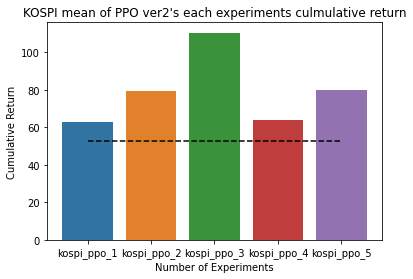

In [125]:
real_kospi = 79 
sns.barplot(y= ppo_ver2_performance_evaluation_transpose['Cumulative Return'], x=ppo_ver2_performance_evaluation_transpose.index )
sns.lineplot(y=real_kospi,x=ppo_ver2_performance_evaluation_transpose.index,color='black',linestyle='--')
plt.title("KOSPI mean of PPO ver2's each experiments culmulative return")
plt.xlabel('Number of Experiments')
plt.ylabel('Cumulative Return')
plt.savefig('./performance/kospi_ppo_ver2.png',dpi=500)

### PPO ver3 HMAX_NORMALIZE=10 & Hold Range = 1 to 5 with int share

In [111]:
kospi_ppo_ver3_1_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold1to5', 'PPO', 1)
kospi_ppo_ver3_2_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold1to5', 'PPO', 2)
kospi_ppo_ver3_3_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold1to5', 'PPO', 3)
kospi_ppo_ver3_4_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold1to5', 'PPO', 4)
kospi_ppo_ver3_5_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold1to5', 'PPO', 5)

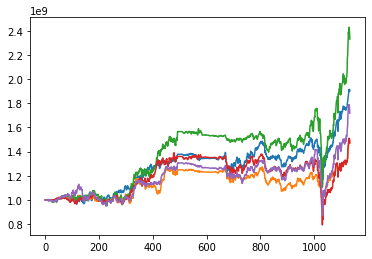

In [112]:
kospi_ppo_ver3_1_account_value.account_value.plot()
kospi_ppo_ver3_2_account_value.account_value.plot()
kospi_ppo_ver3_3_account_value.account_value.plot()
kospi_ppo_ver3_4_account_value.account_value.plot()
kospi_ppo_ver3_5_account_value.account_value.plot()

In [113]:
kospi_ppo_ver3_1_account_value = get_daily_return(kospi_ppo_ver3_1_account_value)
kospi_ppo_ver3_2_account_value = get_daily_return(kospi_ppo_ver3_2_account_value)
kospi_ppo_ver3_3_account_value = get_daily_return(kospi_ppo_ver3_3_account_value)
kospi_ppo_ver3_4_account_value = get_daily_return(kospi_ppo_ver3_4_account_value)
kospi_ppo_ver3_5_account_value = get_daily_return(kospi_ppo_ver3_5_account_value)

In [114]:
kospi_ppo_ver3_1_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver3_2_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver3_3_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver3_4_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver3_5_account_value['Date'] = test_kospi['Date']

In [115]:
kospi_ppo_ver3_1_strat = backtest_strat(kospi_ppo_ver3_1_account_value)
kospi_ppo_ver3_2_strat = backtest_strat(kospi_ppo_ver3_2_account_value)
kospi_ppo_ver3_3_strat = backtest_strat(kospi_ppo_ver3_3_account_value)
kospi_ppo_ver3_4_strat = backtest_strat(kospi_ppo_ver3_4_account_value)
kospi_ppo_ver3_5_strat = backtest_strat(kospi_ppo_ver3_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,12.774%
Cumulative returns,71.767%
Annual volatility,18.485%
Sharpe ratio,0.74
Calmar ratio,0.33
Stability,0.61
Max drawdown,-38.571%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,38.57,2020-02-10,2020-03-18,2020-06-03,83
1,15.97,2016-07-06,2016-12-01,2017-05-18,227
2,13.08,2018-01-26,2018-12-28,2019-04-04,310
3,12.74,2019-04-16,2019-08-23,2020-01-13,195
4,8.08,2020-06-09,2020-06-12,2020-06-22,10


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


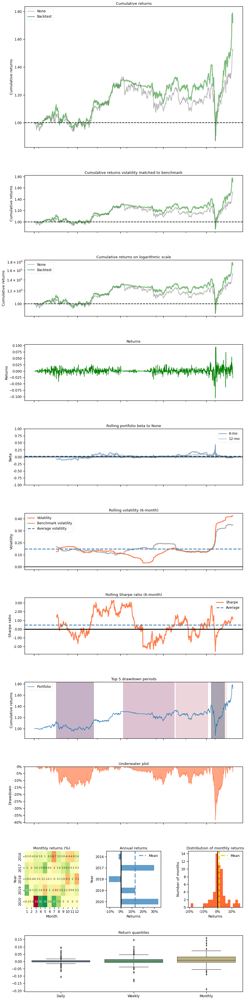

In [120]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ppo_ver3_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [121]:
term = '(2016/01/04-2020/08/13)'
ppo_ver3_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_ppo_1':['90.178%','0%','0%','0','-0%'],
                          'kospi_ppo_2':['47.493%','0%','0%','0','-0%'],
                          'kospi_ppo_3':['133.055%','0%','0%','0','-0%'],
                          'kospi_ppo_4':['47.158%','0%','0%','0','-0%'],
                          'kospi_ppo_5':['71.767%','0%','0%','0','-0%'],
                          }
ppo_ver3_performance_evaluation = pd.DataFrame(ppo_ver3_performance_evaluation).set_index(term)
ppo_ver3_performance_evaluation.to_csv('performance/kospi_ppo_ver3_performance_evaluation_comparison.csv',index=True)
display(ppo_ver3_performance_evaluation)

,kospi_ppo_1,kospi_ppo_2,kospi_ppo_3,kospi_ppo_4,kospi_ppo_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,90.178%,47.493%,133.055%,47.158%,71.767%
Annual Return,0%,0%,0%,0%,0%
Annual Volatility,0%,0%,0%,0%,0%
Sharpe Ratio,0,0,0,0,0
Max Dragdown,-0%,-0%,-0%,-0%,-0%


In [123]:
ppo_ver3_performance_evaluation_transpose = ppo_ver3_performance_evaluation.T
ppo_ver3_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
ppo_ver3_performance_evaluation_transpose = ppo_ver3_performance_evaluation_transpose.apply(pd.to_numeric)
display(ppo_ver3_performance_evaluation_transpose)
display(ppo_ver3_performance_evaluation_transpose.dtypes)

(2016/01/04-2020/08/13),Cumulative Return,Annual Return,Annual Volatility,Sharpe Ratio,Max Dragdown
kospi_ppo_1,90.178,0,0,0,0
kospi_ppo_2,47.493,0,0,0,0
kospi_ppo_3,133.055,0,0,0,0
kospi_ppo_4,47.158,0,0,0,0
kospi_ppo_5,71.767,0,0,0,0


(2016/01/04-2020/08/13)
Cumulative Return    float64
Annual Return          int64
Annual Volatility      int64
Sharpe Ratio           int64
Max Dragdown           int64
dtype: object

In [124]:
ppo_ver3_performance_evaluation_transpose['Cumulative Return'].mean()

77.9302

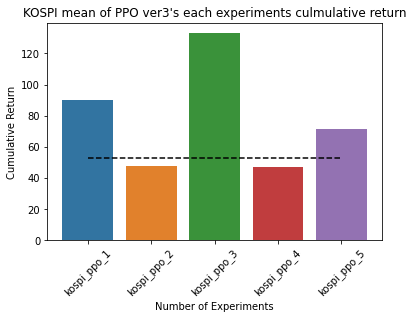

In [125]:
real_kospi = 52.946
sns.barplot(y= ppo_ver3_performance_evaluation_transpose['Cumulative Return'], x=ppo_ver3_performance_evaluation_transpose.index )
sns.lineplot(y=real_kospi,x=ppo_ver3_performance_evaluation_transpose.index,color='black',linestyle='--')
plt.title("KOSPI mean of PPO ver3's each experiments culmulative return")
plt.xlabel('Number of Experiments')
plt.ylabel('Cumulative Return')
plt.xticks(rotation=45)
plt.savefig('./performance/kospi_ppo_ver3.png',dpi=500)

### PPO ver4 HMAX_NORMALIZE=10 & Hold Range = 0 to 4 with int share

In [127]:
kospi_ppo_ver4_1_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold0to4', 'PPO', 1)
kospi_ppo_ver4_2_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold0to4', 'PPO', 2)
kospi_ppo_ver4_3_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold0to4', 'PPO', 3)
kospi_ppo_ver4_4_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold0to4', 'PPO', 4)
kospi_ppo_ver4_5_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NORMALIZE10_hold0to4', 'PPO', 5)

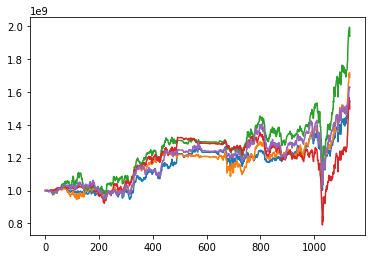

In [128]:
kospi_ppo_ver4_1_account_value.account_value.plot()
kospi_ppo_ver4_2_account_value.account_value.plot()
kospi_ppo_ver4_3_account_value.account_value.plot()
kospi_ppo_ver4_4_account_value.account_value.plot()
kospi_ppo_ver4_5_account_value.account_value.plot()

In [129]:
kospi_ppo_ver4_1_account_value = get_daily_return(kospi_ppo_ver4_1_account_value)
kospi_ppo_ver4_2_account_value = get_daily_return(kospi_ppo_ver4_2_account_value)
kospi_ppo_ver4_3_account_value = get_daily_return(kospi_ppo_ver4_3_account_value)
kospi_ppo_ver4_4_account_value = get_daily_return(kospi_ppo_ver4_4_account_value)
kospi_ppo_ver4_5_account_value = get_daily_return(kospi_ppo_ver4_5_account_value)

In [130]:
kospi_ppo_ver4_1_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver4_2_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver4_3_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver4_4_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver4_5_account_value['Date'] = test_kospi['Date']

In [131]:
kospi_ppo_ver4_1_strat = backtest_strat(kospi_ppo_ver4_1_account_value)
kospi_ppo_ver4_2_strat = backtest_strat(kospi_ppo_ver4_2_account_value)
kospi_ppo_ver4_3_strat = backtest_strat(kospi_ppo_ver4_3_account_value)
kospi_ppo_ver4_4_strat = backtest_strat(kospi_ppo_ver4_4_account_value)
kospi_ppo_ver4_5_strat = backtest_strat(kospi_ppo_ver4_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,11.422%
Cumulative returns,62.691%
Annual volatility,15.594%
Sharpe ratio,0.77
Calmar ratio,0.41
Stability,0.81
Max drawdown,-27.856%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,27.86,2020-02-18,2020-03-18,2020-06-02,76
1,15.07,2019-04-22,2019-08-23,2020-01-10,190
2,10.77,2016-09-26,2016-11-23,2017-05-04,159
3,9.19,2018-04-30,2018-12-28,2019-01-29,197
4,7.50,2020-01-15,2020-01-31,2020-02-18,25


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


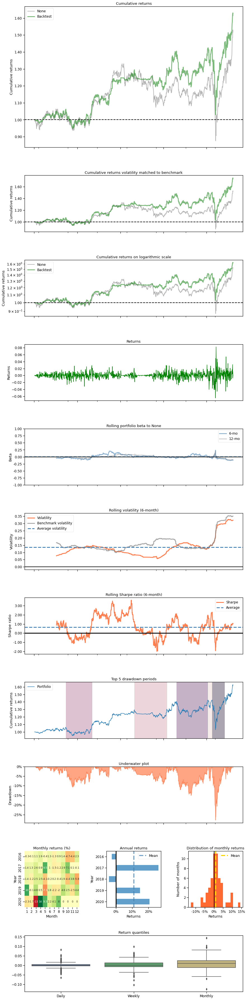

In [136]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ppo_ver4_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [137]:
term = '(2016/01/04-2020/08/13)'
ppo_ver4_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_ppo_1':['54.446%','0%','0%','0','-0%'],
                          'kospi_ppo_2':['69.027%','0%','0%','0','-0%'],
                          'kospi_ppo_3':['93.873%','0%','0%','0','-0%'],
                          'kospi_ppo_4':['49.634%','0%','0%','0','-0%'],
                          'kospi_ppo_5':['62.691%','0%','0%','0','-0%'],
                          }
ppo_ver4_performance_evaluation = pd.DataFrame(ppo_ver4_performance_evaluation).set_index(term)
ppo_ver4_performance_evaluation.to_csv('performance/kospi_ppo_ver4_performance_evaluation_comparison.csv',index=True)
display(ppo_ver4_performance_evaluation)

,kospi_ppo_1,kospi_ppo_2,kospi_ppo_3,kospi_ppo_4,kospi_ppo_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,54.446%,69.027%,93.873%,49.634%,62.691%
Annual Return,0%,0%,0%,0%,0%
Annual Volatility,0%,0%,0%,0%,0%
Sharpe Ratio,0,0,0,0,0
Max Dragdown,-0%,-0%,-0%,-0%,-0%


In [138]:
ppo_ver4_performance_evaluation_transpose = ppo_ver4_performance_evaluation.T
ppo_ver4_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
ppo_ver4_performance_evaluation_transpose = ppo_ver4_performance_evaluation_transpose.apply(pd.to_numeric)
display(ppo_ver4_performance_evaluation_transpose)
display(ppo_ver4_performance_evaluation_transpose.dtypes)

(2016/01/04-2020/08/13),Cumulative Return,Annual Return,Annual Volatility,Sharpe Ratio,Max Dragdown
kospi_ppo_1,54.446,0,0,0,0
kospi_ppo_2,69.027,0,0,0,0
kospi_ppo_3,93.873,0,0,0,0
kospi_ppo_4,49.634,0,0,0,0
kospi_ppo_5,62.691,0,0,0,0


(2016/01/04-2020/08/13)
Cumulative Return    float64
Annual Return          int64
Annual Volatility      int64
Sharpe Ratio           int64
Max Dragdown           int64
dtype: object

In [139]:
ppo_ver4_performance_evaluation_transpose['Cumulative Return'].mean()

65.9342

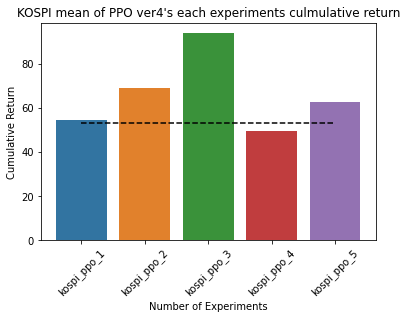

In [140]:
real_kospi = 52.946
sns.barplot(y= ppo_ver4_performance_evaluation_transpose['Cumulative Return'], x=ppo_ver4_performance_evaluation_transpose.index )
sns.lineplot(y=real_kospi,x=ppo_ver4_performance_evaluation_transpose.index,color='black',linestyle='--')
plt.title("KOSPI mean of PPO ver4's each experiments culmulative return")
plt.xlabel('Number of Experiments')
plt.ylabel('Cumulative Return')
plt.xticks(rotation=45)
plt.savefig('./performance/kospi_ppo_ver4.png',dpi=500)

### PPO ver5 Hold Range = 0 to 3 with int share

In [29]:
kospi_ppo_ver5_1_account_value = get_account_value(63, 63, 'kospi', 'ppo_hold0to3', 'PPO', 1)
kospi_ppo_ver5_2_account_value = get_account_value(63, 63, 'kospi', 'ppo_hold0to3', 'PPO', 2)
kospi_ppo_ver5_3_account_value = get_account_value(63, 63, 'kospi', 'ppo_hold0to3', 'PPO', 3)
kospi_ppo_ver5_4_account_value = get_account_value(63, 63, 'kospi', 'ppo_hold0to3', 'PPO', 4)
kospi_ppo_ver5_5_account_value = get_account_value(63, 63, 'kospi', 'ppo_hold0to3', 'PPO', 5)

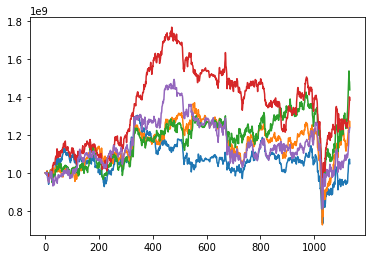

In [30]:
kospi_ppo_ver5_1_account_value.account_value.plot()
kospi_ppo_ver5_2_account_value.account_value.plot()
kospi_ppo_ver5_3_account_value.account_value.plot()
kospi_ppo_ver5_4_account_value.account_value.plot()
kospi_ppo_ver5_5_account_value.account_value.plot()

In [31]:
kospi_ppo_ver5_1_account_value = get_daily_return(kospi_ppo_ver5_1_account_value)
kospi_ppo_ver5_2_account_value = get_daily_return(kospi_ppo_ver5_2_account_value)
kospi_ppo_ver5_3_account_value = get_daily_return(kospi_ppo_ver5_3_account_value)
kospi_ppo_ver5_4_account_value = get_daily_return(kospi_ppo_ver5_4_account_value)
kospi_ppo_ver5_5_account_value = get_daily_return(kospi_ppo_ver5_5_account_value)

In [33]:
kospi_ppo_ver5_1_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver5_2_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver5_3_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver5_4_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver5_5_account_value['Date'] = test_kospi['Date']

In [34]:
kospi_ppo_ver5_1_strat = backtest_strat(kospi_ppo_ver5_1_account_value)
kospi_ppo_ver5_2_strat = backtest_strat(kospi_ppo_ver5_2_account_value)
kospi_ppo_ver5_3_strat = backtest_strat(kospi_ppo_ver5_3_account_value)
kospi_ppo_ver5_4_strat = backtest_strat(kospi_ppo_ver5_4_account_value)
kospi_ppo_ver5_5_strat = backtest_strat(kospi_ppo_ver5_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,4.857%
Cumulative returns,23.788%
Annual volatility,22.722%
Sharpe ratio,0.32
Calmar ratio,0.11
Stability,0.00
Max drawdown,-45.68%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,45.68,2017-12-14,2020-03-18,NaT,NaN
1,9.01,2016-07-12,2016-11-23,2017-01-11,132
2,8.75,2017-01-12,2017-03-02,2017-03-28,54
3,7.71,2016-01-29,2016-02-16,2016-04-12,53
4,6.22,2017-06-09,2017-06-21,2017-09-29,81


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


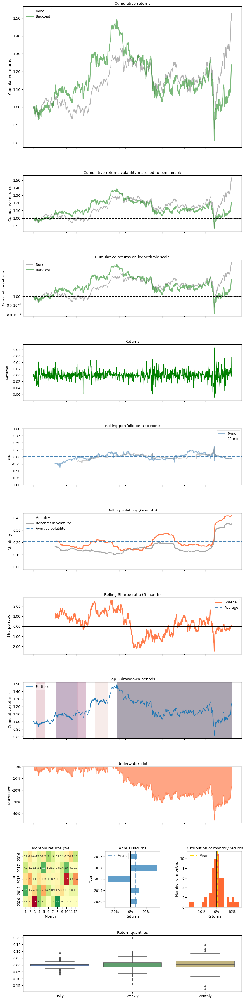

In [35]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ppo_ver5_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

### PPO ver6 HMAX_NORMALIZE=10 with int share

In [58]:
kospi_ppo_ver6_1_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NOMALIZE10', 'PPO', 1)
kospi_ppo_ver6_2_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NOMALIZE10', 'PPO', 2)
kospi_ppo_ver6_3_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NOMALIZE10', 'PPO', 3)
kospi_ppo_ver6_4_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NOMALIZE10', 'PPO', 4)
kospi_ppo_ver6_5_account_value = get_account_value(63, 63, 'kospi', 'ppo_HMAX_NOMALIZE10', 'PPO', 5)

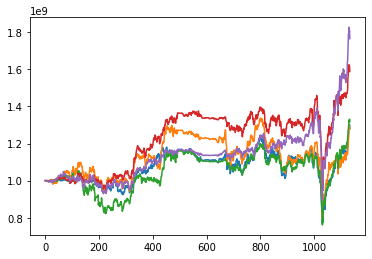

In [59]:
kospi_ppo_ver6_1_account_value.account_value.plot()
kospi_ppo_ver6_2_account_value.account_value.plot()
kospi_ppo_ver6_3_account_value.account_value.plot()
kospi_ppo_ver6_4_account_value.account_value.plot()
kospi_ppo_ver6_5_account_value.account_value.plot()

In [60]:
kospi_ppo_ver6_1_account_value = get_daily_return(kospi_ppo_ver6_1_account_value)
kospi_ppo_ver6_2_account_value = get_daily_return(kospi_ppo_ver6_2_account_value)
kospi_ppo_ver6_3_account_value = get_daily_return(kospi_ppo_ver6_3_account_value)
kospi_ppo_ver6_4_account_value = get_daily_return(kospi_ppo_ver6_4_account_value)
kospi_ppo_ver6_5_account_value = get_daily_return(kospi_ppo_ver6_5_account_value)

In [61]:
kospi_ppo_ver6_1_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver6_2_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver6_3_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver6_4_account_value['Date'] = test_kospi['Date']
kospi_ppo_ver6_5_account_value['Date'] = test_kospi['Date']

In [62]:
kospi_ppo_ver6_1_strat = backtest_strat(kospi_ppo_ver6_1_account_value)
kospi_ppo_ver6_2_strat = backtest_strat(kospi_ppo_ver6_2_account_value)
kospi_ppo_ver6_3_strat = backtest_strat(kospi_ppo_ver6_3_account_value)
kospi_ppo_ver6_4_strat = backtest_strat(kospi_ppo_ver6_4_account_value)
kospi_ppo_ver6_5_strat = backtest_strat(kospi_ppo_ver6_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,13.464%
Cumulative returns,76.551%
Annual volatility,16.927%
Sharpe ratio,0.83
Calmar ratio,0.38
Stability,0.72
Max drawdown,-35.72%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,35.72,2020-02-18,2020-03-18,2020-05-29,74
1,11.38,2016-04-12,2016-11-18,2017-05-19,289
2,8.40,2019-04-29,2019-05-27,2020-01-06,181
3,6.03,2020-06-10,2020-06-12,2020-06-15,4
4,5.20,2018-03-21,2018-10-26,2018-11-28,181


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


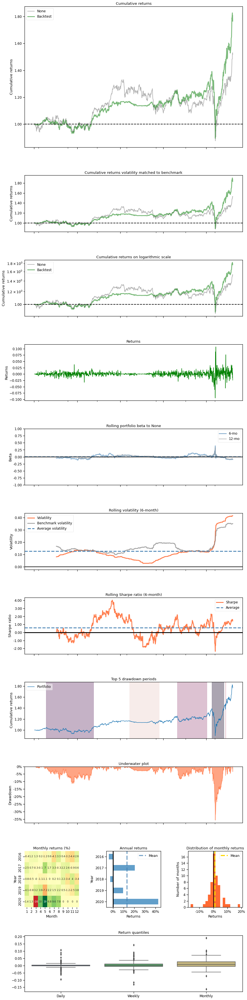

In [69]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ppo_ver6_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [70]:
term = '(2016/01/04-2020/08/13)'
ppo_ver6_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_ppo_1':['28.108%','5.659%','16.745%','0.41','-37.982%'],
                          'kospi_ppo_2':['27.955%','5.631%','18.634%','0.39','-40.355%'],
                          'kospi_ppo_3':['31.801%','6.328%','17.188%','0.44','-36.584%'],
                          'kospi_ppo_4':['58.832%','10.829%','16.549%','0.70','-35.091%'],
                          'kospi_ppo_5':['76.551%','13.464%','16.927%','0.83','-35.72%'],
                          }
ppo_ver6_performance_evaluation = pd.DataFrame(ppo_ver6_performance_evaluation).set_index(term)
ppo_ver6_performance_evaluation.to_csv('performance/kospi_ppo_ver6_performance_evaluation_comparison.csv',index=True)
display(ppo_ver6_performance_evaluation)

,kospi_ppo_1,kospi_ppo_2,kospi_ppo_3,kospi_ppo_4,kospi_ppo_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,28.108%,27.955%,31.801%,58.832%,76.551%
Annual Return,5.659%,5.631%,6.328%,10.829%,13.464%
Annual Volatility,16.745%,18.634%,17.188%,16.549%,16.927%
Sharpe Ratio,0.41,0.39,0.44,0.70,0.83
Max Dragdown,-37.982%,-40.355%,-36.584%,-35.091%,-35.72%


In [71]:
ppo_ver6_performance_evaluation_transpose = ppo_ver6_performance_evaluation.T
ppo_ver6_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
ppo_ver6_performance_evaluation_transpose = ppo_ver6_performance_evaluation_transpose.apply(pd.to_numeric)
display(ppo_ver6_performance_evaluation_transpose)
display(ppo_ver6_performance_evaluation_transpose.dtypes)

(2016/01/04-2020/08/13),Cumulative Return,Annual Return,Annual Volatility,Sharpe Ratio,Max Dragdown
kospi_ppo_1,28.108,5.659,16.745,0.41,-37.982
kospi_ppo_2,27.955,5.631,18.634,0.39,-40.355
kospi_ppo_3,31.801,6.328,17.188,0.44,-36.584
kospi_ppo_4,58.832,10.829,16.549,0.70,-35.091
kospi_ppo_5,76.551,13.464,16.927,0.83,-35.720


(2016/01/04-2020/08/13)
Cumulative Return    float64
Annual Return        float64
Annual Volatility    float64
Sharpe Ratio         float64
Max Dragdown         float64
dtype: object

In [72]:
ppo_ver6_performance_evaluation_transpose['Cumulative Return'].mean()

44.6494

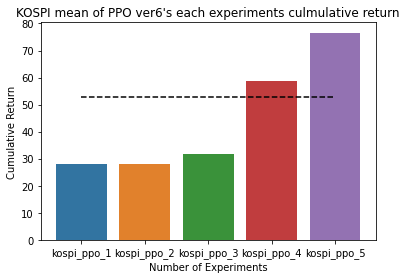

In [74]:
real_kospi = 52.946
sns.barplot(y= ppo_ver6_performance_evaluation_transpose['Cumulative Return'], x=ppo_ver6_performance_evaluation_transpose.index )
sns.lineplot(y=real_kospi,x=ppo_ver6_performance_evaluation_transpose.index,color='black',linestyle='--')
plt.title("KOSPI mean of PPO ver6's each experiments culmulative return")
plt.xlabel('Number of Experiments')
plt.ylabel('Cumulative Return')
plt.savefig('./performance/kospi_ppo_ver6.png',dpi=500)

----------

### regulate turbulance threshold=0 PPO

In [91]:
kospi_ppo_tt0_1_account_value = get_account_value(63, 63, 'kospi', 'ppo_tt0', 'PPO', 1)
kospi_ppo_tt0_2_account_value = get_account_value(63, 63, 'kospi', 'ppo_tt0', 'PPO', 2)
kospi_ppo_tt0_3_account_value = get_account_value(63, 63, 'kospi', 'ppo_tt0', 'PPO', 3)
kospi_ppo_tt0_4_account_value = get_account_value(63, 63, 'kospi', 'ppo_tt0', 'PPO', 4)
kospi_ppo_tt0_5_account_value = get_account_value(63, 63, 'kospi', 'ppo_tt0', 'PPO', 5)

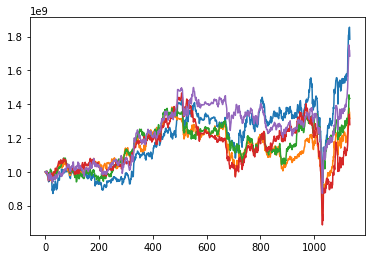

In [92]:
kospi_ppo_tt0_1_account_value.account_value.plot()
kospi_ppo_tt0_2_account_value.account_value.plot()
kospi_ppo_tt0_3_account_value.account_value.plot()
kospi_ppo_tt0_4_account_value.account_value.plot()
kospi_ppo_tt0_5_account_value.account_value.plot()

In [93]:
kospi_ppo_tt0_1_account_value = get_daily_return(kospi_ppo_tt0_1_account_value)
kospi_ppo_tt0_2_account_value = get_daily_return(kospi_ppo_tt0_2_account_value)
kospi_ppo_tt0_3_account_value = get_daily_return(kospi_ppo_tt0_3_account_value)
kospi_ppo_tt0_4_account_value = get_daily_return(kospi_ppo_tt0_4_account_value)
kospi_ppo_tt0_5_account_value = get_daily_return(kospi_ppo_tt0_5_account_value)

In [94]:
kospi_ppo_tt0_1_account_value['Date'] = test_kospi['Date']
kospi_ppo_tt0_2_account_value['Date'] = test_kospi['Date']
kospi_ppo_tt0_3_account_value['Date'] = test_kospi['Date']
kospi_ppo_tt0_4_account_value['Date'] = test_kospi['Date']
kospi_ppo_tt0_5_account_value['Date'] = test_kospi['Date']

In [95]:
kospi_ppo_tt0_1_strat = backtest_strat(kospi_ppo_tt0_1_account_value)
kospi_ppo_tt0_2_strat = backtest_strat(kospi_ppo_tt0_2_account_value)
kospi_ppo_tt0_3_strat = backtest_strat(kospi_ppo_tt0_3_account_value)
kospi_ppo_tt0_4_strat = backtest_strat(kospi_ppo_tt0_4_account_value)
kospi_ppo_tt0_5_strat = backtest_strat(kospi_ppo_tt0_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,12.295%
Cumulative returns,68.509%
Annual volatility,20.575%
Sharpe ratio,0.67
Calmar ratio,0.29
Stability,0.46
Max drawdown,-41.832%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,41.83,2018-04-03,2020-03-18,2020-08-04,611
1,11.17,2018-01-26,2018-02-28,2018-04-03,48
2,9.62,2017-02-23,2017-03-02,2017-04-20,41
3,8.76,2016-09-28,2016-11-16,2017-02-23,107
4,8.13,2016-06-07,2016-08-02,2016-09-22,78


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


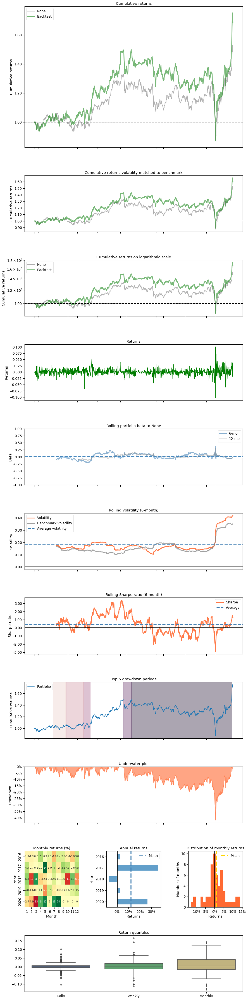

In [96]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ppo_tt0_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [97]:
term = '(2016/01/04-2020/08/13)'
ppo_tt0_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_ppo_tt0_1':['78.483%','13.739%','23.223%','0.67','-39.933%'],
                          'kospi_ppo_tt0_2':['31.59%','6.29%','21.44%','0.39','-45.833%'],
                          'kospi_ppo_tt0_3':['43.407%','8.341%','20.272%','0.50','-34.806%'],
                          'kospi_ppo_tt0_4':['27.948%','5.63%','24.1%','0.35','-53.234%'],
                          'kospi_ppo_tt0_5':['68.509%','12.295%','20.575%','0.67','-41.832%'],
                          }
ppo_tt0_performance_evaluation = pd.DataFrame(ppo_tt0_performance_evaluation).set_index(term)
ppo_tt0_performance_evaluation.to_csv('performance/kospi_ppo_tt0_performance_evaluation_comparison.csv',index=True)
display(ppo_tt0_performance_evaluation)

,kospi_ppo_tt0_1,kospi_ppo_tt0_2,kospi_ppo_tt0_3,kospi_ppo_tt0_4,kospi_ppo_tt0_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,78.483%,31.59%,43.407%,27.948%,68.509%
Annual Return,13.739%,6.29%,8.341%,5.63%,12.295%
Annual Volatility,23.223%,21.44%,20.272%,24.1%,20.575%
Sharpe Ratio,0.67,0.39,0.50,0.35,0.67
Max Dragdown,-39.933%,-45.833%,-34.806%,-53.234%,-41.832%


In [ ]:
ppo_tt0_performance_evaluation_transpose = ppo_tt0_performance_evaluation.T
ppo_tt0_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
ppo_tt0_performance_evaluation_transpose = ppo_tt0_performance_evaluation_transpose.apply(pd.to_numeric)
display(ppo_tt0_performance_evaluation_transpose)
display(ppo_tt0_performance_evaluation_transpose.dtypes)

In [ ]:
ppo_tt0_performance_evaluation_transpose['Cumulative Return'].mean()
#ensemble_performance_evaluation_transpose['Annual Return'].mean()
#ensemble_performance_evaluation_transpose['Annual Volatility'].mean()
#ensemble_performance_evaluation_transpose['Sharpe Ratio'].mean()
#ensemble_performance_evaluation_transpose['Max Dragdown'].mean()

### regulate turbulance threshold=50 PPO

In [99]:
kospi_ppo_tt50_1_account_value = get_account_value(63, 63, 'kospi', 'ppo_tt50', 'PPO', 1)
#kospi_ppo_tt50_2_account_value = get_account_value(63, 63, 'kospi', 'ppo_tt50', 'PPO', 2)
#kospi_ppo_tt50_3_account_value = get_account_value(63, 63, 'kospi', 'ppo_tt50', 'PPO', 3)
#kospi_ppo_tt50_4_account_value = get_account_value(63, 63, 'kospi', 'ppo_tt50', 'PPO', 4)
#kospi_ppo_tt50_5_account_value = get_account_value(63, 63, 'kospi', 'ppo_tt50', 'PPO', 5)

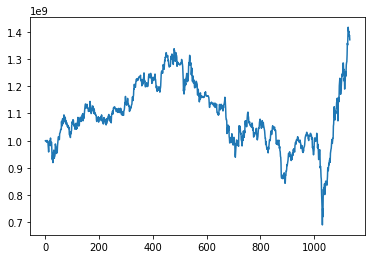

In [100]:
kospi_ppo_tt50_1_account_value.account_value.plot()
#kospi_ppo_tt50_2_account_value.account_value.plot()
#kospi_ppo_tt50_3_account_value.account_value.plot()
#kospi_ppo_tt50_4_account_value.account_value.plot()
#kospi_ppo_tt50_5_account_value.account_value.plot()

In [30]:
kospi_ppo_tt50_1_account_value = get_daily_return(kospi_ppo_tt50_1_account_value)
#kospi_ppo_tt50_2_account_value = get_daily_return(kospi_ppo_tt50_2_account_value)
#kospi_ppo_tt50_3_account_value = get_daily_return(kospi_ppo_tt50_3_account_value)
#kospi_ppo_tt50_4_account_value = get_daily_return(kospi_ppo_tt50_4_account_value)
#kospi_ppo_tt50_5_account_value = get_daily_return(kospi_ppo_tt50_5_account_value)

In [102]:
kospi_ppo_tt50_1_account_value = get_daily_return(kospi_ppo_tt50_1_account_value)
#kospi_ppo_tt50_2_account_value = get_daily_return(kospi_ppo_tt50_2_account_value)
#kospi_ppo_tt50_3_account_value = get_daily_return(kospi_ppo_tt50_3_account_value)
#kospi_ppo_tt50_4_account_value = get_daily_return(kospi_ppo_tt50_4_account_value)
#kospi_ppo_tt50_5_account_value = get_daily_return(kospi_ppo_tt50_5_account_value)

In [103]:
kospi_ppo_tt50_1_account_value['Date'] = test_kospi['Date']
#kospi_ppo_tt50_2_account_value['Date'] = test_kospi['Date']
#kospi_ppo_tt50_3_account_value['Date'] = test_kospi['Date']
#kospi_ppo_tt50_4_account_value['Date'] = test_kospi['Date']
#kospi_ppo_tt50_5_account_value['Date'] = test_kospi['Date']

In [104]:
kospi_ppo_tt50_1_strat = backtest_strat(kospi_ppo_tt50_1_account_value)
#kospi_ppo_tt50_2_strat = backtest_strat(kospi_ppo_tt50_2_account_value)
#kospi_ppo_tt50_3_strat = backtest_strat(kospi_ppo_tt50_3_account_value)
#kospi_ppo_tt50_4_strat = backtest_strat(kospi_ppo_tt50_4_account_value)
#kospi_ppo_tt50_5_strat = backtest_strat(kospi_ppo_tt50_5_account_value)

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,7.259%
Cumulative returns,37.074%
Annual volatility,20.734%
Sharpe ratio,0.44
Calmar ratio,0.15
Stability,0.07
Max drawdown,-48.39%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,48.39,2017-12-14,2020-03-18,2020-07-31,687
1,8.94,2016-01-29,2016-02-16,2016-03-16,34
2,7.60,2016-04-15,2016-05-23,2016-07-26,73
3,7.54,2016-09-05,2016-12-02,2017-03-20,141
4,5.66,2017-06-30,2017-09-22,2017-10-10,73


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


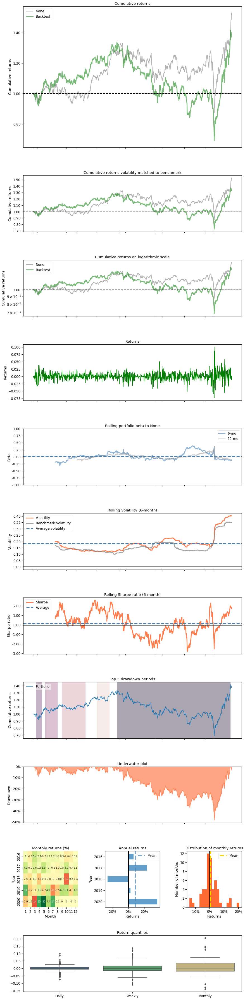

In [105]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ppo_tt50_1_strat,
                                   benchmark_rets=dow_strat, set_context=False)

## A2C

In [45]:
kospi_a2c_1_account_value = get_account_value(63, 63, 'kospi', 'a2c', 'A2C', 1)
kospi_a2c_2_account_value = get_account_value(63, 63, 'kospi', 'a2c', 'A2C', 2)
kospi_a2c_3_account_value = get_account_value(63, 63, 'kospi', 'a2c', 'A2C', 3)
kospi_a2c_4_account_value = get_account_value(63, 63, 'kospi', 'a2c', 'A2C', 4)
kospi_a2c_5_account_value = get_account_value(63, 63, 'kospi', 'a2c', 'A2C', 5)
display(kospi_a2c_1_account_value)

,account_value,datadate
0,1.000000e+09,20160104
1,1.000518e+09,20160105
2,9.958396e+08,20160106
3,9.980681e+08,20160107
4,9.904257e+08,20160108
...,...,...
1129,1.014543e+09,20200807
1130,1.074298e+09,20200810
1131,1.067736e+09,20200811
1132,1.078936e+09,20200812


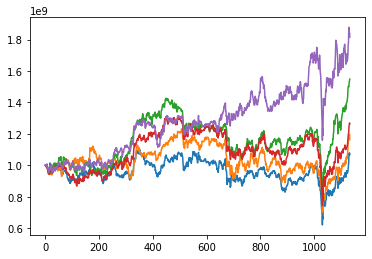

In [46]:
kospi_a2c_1_account_value.account_value.plot()
kospi_a2c_2_account_value.account_value.plot()
kospi_a2c_3_account_value.account_value.plot()
kospi_a2c_4_account_value.account_value.plot()
kospi_a2c_5_account_value.account_value.plot()

In [47]:
kospi_a2c_1_account_value = get_daily_return(kospi_a2c_1_account_value)
kospi_a2c_2_account_value = get_daily_return(kospi_a2c_2_account_value)
kospi_a2c_3_account_value = get_daily_return(kospi_a2c_3_account_value)
kospi_a2c_4_account_value = get_daily_return(kospi_a2c_4_account_value)
kospi_a2c_5_account_value = get_daily_return(kospi_a2c_5_account_value)

In [48]:
kospi_a2c_1_account_value['Date'] = test_kospi['Date']
kospi_a2c_2_account_value['Date'] = test_kospi['Date']
kospi_a2c_3_account_value['Date'] = test_kospi['Date']
kospi_a2c_4_account_value['Date'] = test_kospi['Date']
kospi_a2c_5_account_value['Date'] = test_kospi['Date']
#display(kospi_a2c_1_account_value)

In [49]:
kospi_a2c_1_strat = backtest_strat(kospi_a2c_1_account_value)
kospi_a2c_2_strat = backtest_strat(kospi_a2c_2_account_value)
kospi_a2c_3_strat = backtest_strat(kospi_a2c_3_account_value)
kospi_a2c_4_strat = backtest_strat(kospi_a2c_4_account_value)
kospi_a2c_5_strat = backtest_strat(kospi_a2c_5_account_value)
#display(pd.DataFrame(kospi_a2c_1_strat))

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,14.17%
Cumulative returns,81.547%
Annual volatility,21.591%
Sharpe ratio,0.72
Calmar ratio,0.42
Stability,0.90
Max drawdown,-33.791%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,33.79,2020-02-18,2020-03-18,2020-06-02,76
1,14.23,2019-04-22,2019-06-03,2020-01-03,185
2,13.72,2017-06-26,2017-09-13,2017-10-31,92
3,12.68,2020-06-02,2020-06-12,2020-08-07,49
4,10.51,2018-09-28,2018-10-26,2019-02-13,99


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


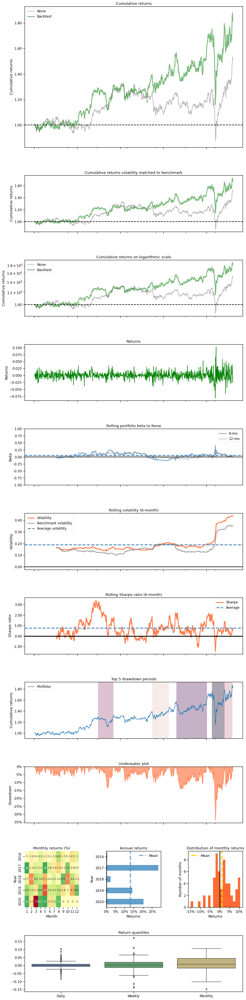

In [50]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_a2c_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [51]:
a2c_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_a2c_1':['6.834%','1.48%','21.009%','0.17','-43.6%'],
                          'kospi_a2c_2':['16.24%','3.401%','22.324%','0.26','-43.334%'],
                          'kospi_a2c_3':['54.811%','10.199%','20.352%','0.58','-42.982%'],
                          'kospi_a2c_4':['26.434%','5.35%','20.612%','0.36','-43.158%'],
                          'kospi_a2c_5':['81.547%','14.17%','21.591%','0.72','-33.791%'],
                          }
a2c_performance_evaluation = pd.DataFrame(a2c_performance_evaluation).set_index(term)
a2c_performance_evaluation.to_csv('performance/kospi_a2c_performance_evaluation_comparison.csv',index=True)
display(a2c_performance_evaluation)

,kospi_a2c_1,kospi_a2c_2,kospi_a2c_3,kospi_a2c_4,kospi_a2c_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,6.834%,16.24%,54.811%,26.434%,81.547%
Annual Return,1.48%,3.401%,10.199%,5.35%,14.17%
Annual Volatility,21.009%,22.324%,20.352%,20.612%,21.591%
Sharpe Ratio,0.17,0.26,0.58,0.36,0.72
Max Dragdown,-43.6%,-43.334%,-42.982%,-43.158%,-33.791%


In [52]:
a2c_performance_evaluation_transpose = a2c_performance_evaluation.T
a2c_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
a2c_performance_evaluation_transpose = a2c_performance_evaluation_transpose.apply(pd.to_numeric)
display(a2c_performance_evaluation_transpose)
display(a2c_performance_evaluation_transpose.dtypes)

(2016/01/04-2020/08/13),Cumulative Return,Annual Return,Annual Volatility,Sharpe Ratio,Max Dragdown
kospi_a2c_1,6.834,1.480,21.009,0.17,-43.600
kospi_a2c_2,16.240,3.401,22.324,0.26,-43.334
kospi_a2c_3,54.811,10.199,20.352,0.58,-42.982
kospi_a2c_4,26.434,5.350,20.612,0.36,-43.158
kospi_a2c_5,81.547,14.170,21.591,0.72,-33.791


(2016/01/04-2020/08/13)
Cumulative Return    float64
Annual Return        float64
Annual Volatility    float64
Sharpe Ratio         float64
Max Dragdown         float64
dtype: object

In [53]:
a2c_performance_evaluation_transpose['Cumulative Return'].mean()
#a2c_performance_evaluation_transpose['Annual Return'].mean()
#a2c_performance_evaluation_transpose['Annual Volatility'].mean()
#a2c_performance_evaluation_transpose['Sharpe Ratio'].mean()
#a2c_performance_evaluation_transpose['Max Dragdown'].mean()

37.173199999999994

## DDPG

In [54]:
kospi_ddpg_1_account_value = get_account_value(63, 63, 'kospi', 'ddpg', 'ddpg', 1)
kospi_ddpg_2_account_value = get_account_value(63, 63, 'kospi', 'ddpg', 'ddpg', 2)
kospi_ddpg_3_account_value = get_account_value(63, 63, 'kospi', 'ddpg', 'ddpg', 3)
kospi_ddpg_4_account_value = get_account_value(63, 63, 'kospi', 'ddpg', 'ddpg', 4)
kospi_ddpg_5_account_value = get_account_value(63, 63, 'kospi', 'ddpg', 'ddpg', 5)
display(kospi_ddpg_1_account_value)

,account_value,datadate
0,1.000000e+09,20160104
1,1.000262e+09,20160105
2,9.950097e+08,20160106
3,9.994086e+08,20160107
4,9.896710e+08,20160108
...,...,...
1129,1.537943e+09,20200807
1130,1.574002e+09,20200810
1131,1.566284e+09,20200811
1132,1.598037e+09,20200812


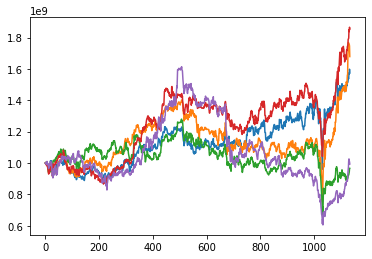

In [55]:
kospi_ddpg_1_account_value.account_value.plot()
kospi_ddpg_2_account_value.account_value.plot()
kospi_ddpg_3_account_value.account_value.plot()
kospi_ddpg_4_account_value.account_value.plot()
kospi_ddpg_5_account_value.account_value.plot()

In [56]:
kospi_ddpg_1_account_value = get_daily_return(kospi_ddpg_1_account_value)
kospi_ddpg_2_account_value = get_daily_return(kospi_ddpg_2_account_value)
kospi_ddpg_3_account_value = get_daily_return(kospi_ddpg_3_account_value)
kospi_ddpg_4_account_value = get_daily_return(kospi_ddpg_4_account_value)
kospi_ddpg_5_account_value = get_daily_return(kospi_ddpg_5_account_value)

In [57]:
kospi_ddpg_1_account_value['Date'] = test_kospi['Date']
kospi_ddpg_2_account_value['Date'] = test_kospi['Date']
kospi_ddpg_3_account_value['Date'] = test_kospi['Date']
kospi_ddpg_4_account_value['Date'] = test_kospi['Date']
kospi_ddpg_5_account_value['Date'] = test_kospi['Date']
#display(kospi_ensemble_1_account_value)

In [58]:
kospi_ddpg_1_strat = backtest_strat(kospi_ddpg_1_account_value)
kospi_ddpg_2_strat = backtest_strat(kospi_ddpg_2_account_value)
kospi_ddpg_3_strat = backtest_strat(kospi_ddpg_3_account_value)
kospi_ddpg_4_strat = backtest_strat(kospi_ddpg_4_account_value)
kospi_ddpg_5_strat = backtest_strat(kospi_ddpg_5_account_value)
#display(pd.DataFrame(kospi_ddpg_1_strat))

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,-0.148%
Cumulative returns,-0.665%
Annual volatility,23.139%
Sharpe ratio,0.11
Calmar ratio,-0.00
Stability,0.06
Max drawdown,-62.507%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,62.51,2018-01-26,2020-03-20,NaT,NaN
1,23.08,2016-07-06,2016-12-07,2017-06-23,253
2,10.45,2016-01-29,2016-02-16,2016-03-23,39
3,7.02,2017-09-18,2017-09-27,2017-10-12,19
4,6.68,2017-07-17,2017-08-10,2017-08-22,27


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


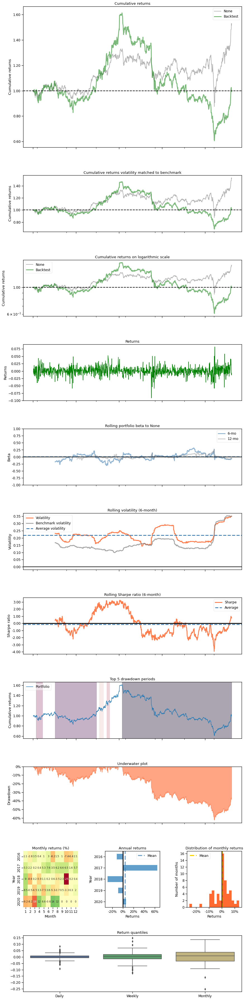

In [59]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_ddpg_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [60]:
term = '(2016/01/04-2020/08/13)'
ddpg_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_ddpg_1':['57.348%','10.598%','21.496%','0.58','-31.588%'],
                          'kospi_ddpg_2':['67.857%','12.198%','24.632%','0.59','-46.341%'],
                          'kospi_ddpg_3':['-3.39%','-0.764%','21.692%','0.07','-47.8%'],
                          'kospi_ddpg_4':['85.426%','14.708%','19.724%','0.79','-30.988%'],
                          'kospi_ddpg_5':['-0.665%','-0.148%','23.139%','0.06','-62.507%']
                          }
ddpg_performance_evaluation = pd.DataFrame(ddpg_performance_evaluation).set_index(term)
ddpg_performance_evaluation.to_csv('performance/kospi_ddpg_performance_evaluation_comparison.csv',index=True)
display(ddpg_performance_evaluation)

,kospi_ddpg_1,kospi_ddpg_2,kospi_ddpg_3,kospi_ddpg_4,kospi_ddpg_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,57.348%,67.857%,-3.39%,85.426%,-0.665%
Annual Return,10.598%,12.198%,-0.764%,14.708%,-0.148%
Annual Volatility,21.496%,24.632%,21.692%,19.724%,23.139%
Sharpe Ratio,0.58,0.59,0.07,0.79,0.06
Max Dragdown,-31.588%,-46.341%,-47.8%,-30.988%,-62.507%


In [61]:
ddpg_performance_evaluation_transpose = ddpg_performance_evaluation.T
ddpg_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
ddpg_performance_evaluation_transpose = ddpg_performance_evaluation_transpose.apply(pd.to_numeric)
display(ddpg_performance_evaluation_transpose)
display(ddpg_performance_evaluation_transpose.dtypes)

(2016/01/04-2020/08/13),Cumulative Return,Annual Return,Annual Volatility,Sharpe Ratio,Max Dragdown
kospi_ddpg_1,57.348,10.598,21.496,0.58,-31.588
kospi_ddpg_2,67.857,12.198,24.632,0.59,-46.341
kospi_ddpg_3,-3.390,-0.764,21.692,0.07,-47.800
kospi_ddpg_4,85.426,14.708,19.724,0.79,-30.988
kospi_ddpg_5,-0.665,-0.148,23.139,0.06,-62.507


(2016/01/04-2020/08/13)
Cumulative Return    float64
Annual Return        float64
Annual Volatility    float64
Sharpe Ratio         float64
Max Dragdown         float64
dtype: object

In [62]:
ddpg_performance_evaluation_transpose['Cumulative Return'].mean()
#ddpg_performance_evaluation_transpose['Annual Return'].mean()
#ddpg_performance_evaluation_transpose['Annual Volatility'].mean()
#ddpg_performance_evaluation_transpose['Sharpe Ratio'].mean()
#ddpg_performance_evaluation_transpose['Max Dragdown'].mean()

41.3152

## Remake Ensemble

In [63]:
kospi_remakeEnsemble_1_account_value = get_account_value(63, 63, 'kospi', 'remakeEnsemble', 'remake_ensemble', 1)
kospi_remakeEnsemble_2_account_value = get_account_value(63, 63, 'kospi', 'remakeEnsemble', 'remake_ensemble', 2)
kospi_remakeEnsemble_3_account_value = get_account_value(63, 63, 'kospi', 'remakeEnsemble', 'remake_ensemble', 3)
kospi_remakeEnsemble_4_account_value = get_account_value(63, 63, 'kospi', 'remakeEnsemble', 'remake_ensemble', 4)
kospi_remakeEnsemble_5_account_value = get_account_value(63, 63, 'kospi', 'remakeEnsemble', 'remake_ensemble', 5)
display(kospi_remakeEnsemble_1_account_value)

,account_value,datadate
0,1.000000e+09,20160104
1,1.000734e+09,20160105
2,9.897861e+08,20160106
3,9.986626e+08,20160107
4,9.868450e+08,20160108
...,...,...
1129,7.812041e+08,20200807
1130,8.179584e+08,20200810
1131,8.102322e+08,20200811
1132,8.113562e+08,20200812


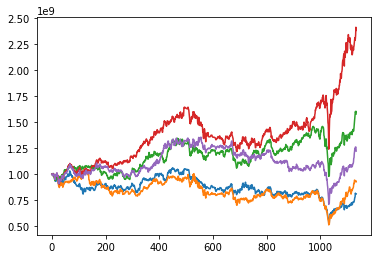

In [64]:
kospi_remakeEnsemble_1_account_value.account_value.plot()
kospi_remakeEnsemble_2_account_value.account_value.plot()
kospi_remakeEnsemble_3_account_value.account_value.plot()
kospi_remakeEnsemble_4_account_value.account_value.plot()
kospi_remakeEnsemble_5_account_value.account_value.plot()

In [65]:
kospi_remakeEnsemble_1_account_value = get_daily_return(kospi_remakeEnsemble_1_account_value)
kospi_remakeEnsemble_2_account_value = get_daily_return(kospi_remakeEnsemble_2_account_value)
kospi_remakeEnsemble_3_account_value = get_daily_return(kospi_remakeEnsemble_3_account_value)
kospi_remakeEnsemble_4_account_value = get_daily_return(kospi_remakeEnsemble_4_account_value)
kospi_remakeEnsemble_5_account_value = get_daily_return(kospi_remakeEnsemble_5_account_value)

In [66]:
kospi_remakeEnsemble_1_account_value['Date'] = test_kospi['Date']
kospi_remakeEnsemble_2_account_value['Date'] = test_kospi['Date']
kospi_remakeEnsemble_3_account_value['Date'] = test_kospi['Date']
kospi_remakeEnsemble_4_account_value['Date'] = test_kospi['Date']
kospi_remakeEnsemble_5_account_value['Date'] = test_kospi['Date']
#display(kospi_remakeEnsemble_1_account_value)

In [67]:
kospi_remakeEnsemble_1_strat = backtest_strat(kospi_remakeEnsemble_1_account_value)
kospi_remakeEnsemble_2_strat = backtest_strat(kospi_remakeEnsemble_2_account_value)
kospi_remakeEnsemble_3_strat = backtest_strat(kospi_remakeEnsemble_3_account_value)
kospi_remakeEnsemble_4_strat = backtest_strat(kospi_remakeEnsemble_4_account_value)
kospi_remakeEnsemble_5_strat = backtest_strat(kospi_remakeEnsemble_5_account_value)
#display(pd.DataFrame(kospi_remakeEnsemble_1_strat))

Start date,2016-01-04
End date,2020-08-13
Total months,54
,Backtest
Annual return,4.536%
Cumulative returns,22.096%
Annual volatility,21.105%
Sharpe ratio,0.32
Calmar ratio,0.10
Stability,0.01
Max drawdown,-47.579%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,47.58,2018-04-09,2020-03-18,NaT,NaN
1,12.50,2016-04-12,2016-06-24,2016-09-05,105
2,12.28,2016-09-06,2017-02-08,2017-07-24,230
3,10.26,2016-01-29,2016-02-11,2016-03-23,39
4,6.79,2017-11-23,2018-03-06,2018-03-28,90


/home/kongminseok/anaconda3/envs/k/lib/python3.7/site-packages/pyfolio/tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


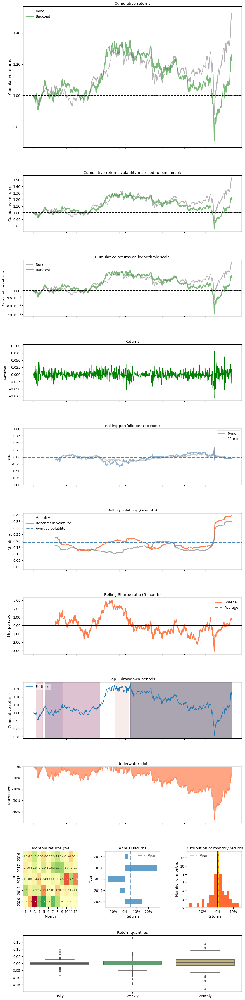

In [68]:
with pyfolio.plotting.plotting_context(font_scale=1.1):
    pyfolio.create_full_tear_sheet(returns = kospi_remakeEnsemble_5_strat,
                                   benchmark_rets=dow_strat, set_context=False)

In [69]:
remakeEnsemble_performance_evaluation = {term:['Cumulative Return','Annual Return', 'Annual Volatility','Sharpe Ratio', 'Max Dragdown'],
                          'kospi_remakeEnsemble_1':['-18.995%','-4.573%','20.745%','-0.12','-50.566%'],
                          'kospi_remakeEnsemble_2':['-7.314%','-1.674%','23.237%','0.04','-51.151%'],
                          'kospi_remakeEnsemble_3':['57.708%','10.654%','19.805%','0.61','-32.879%'],
                          'kospi_remakeEnsemble_4':['137.848%','21.233%','22.102%','0.98','-29.52%'],
                          'kospi_remakeEnsemble_5':['22.069%','4.536%','21.105%','0.32','-47.579%'],
                          }
remakeEnsemble_performance_evaluation = pd.DataFrame(remakeEnsemble_performance_evaluation).set_index(term)
remakeEnsemble_performance_evaluation.to_csv('performance/kospi_remakeEnsemble_performance_evaluation_comparison.csv',index=True)
display(remakeEnsemble_performance_evaluation)

,kospi_remakeEnsemble_1,kospi_remakeEnsemble_2,kospi_remakeEnsemble_3,kospi_remakeEnsemble_4,kospi_remakeEnsemble_5
(2016/01/04-2020/08/13),,,,,
Cumulative Return,-18.995%,-7.314%,57.708%,137.848%,22.069%
Annual Return,-4.573%,-1.674%,10.654%,21.233%,4.536%
Annual Volatility,20.745%,23.237%,19.805%,22.102%,21.105%
Sharpe Ratio,-0.12,0.04,0.61,0.98,0.32
Max Dragdown,-50.566%,-51.151%,-32.879%,-29.52%,-47.579%


In [70]:
remakeEnsemble_performance_evaluation_transpose = remakeEnsemble_performance_evaluation.T
remakeEnsemble_performance_evaluation_transpose.apply(lambda x: x.replace("%","",regex=True,inplace=True)) # 부분일치의 경우, regex=True 파라미터를 추가함으로써 해당 문자가 포함되어 있으면 문자가 대체된다.
remakeEnsemble_performance_evaluation_transpose = remakeEnsemble_performance_evaluation_transpose.apply(pd.to_numeric)
display(remakeEnsemble_performance_evaluation_transpose)
display(remakeEnsemble_performance_evaluation_transpose.dtypes)

(2016/01/04-2020/08/13),Cumulative Return,Annual Return,Annual Volatility,Sharpe Ratio,Max Dragdown
kospi_remakeEnsemble_1,-18.995,-4.573,20.745,-0.12,-50.566
kospi_remakeEnsemble_2,-7.314,-1.674,23.237,0.04,-51.151
kospi_remakeEnsemble_3,57.708,10.654,19.805,0.61,-32.879
kospi_remakeEnsemble_4,137.848,21.233,22.102,0.98,-29.520
kospi_remakeEnsemble_5,22.069,4.536,21.105,0.32,-47.579


(2016/01/04-2020/08/13)
Cumulative Return    float64
Annual Return        float64
Annual Volatility    float64
Sharpe Ratio         float64
Max Dragdown         float64
dtype: object

In [71]:
remakeEnsemble_performance_evaluation_transpose['Cumulative Return'].mean()
#remakeEnsemble_performance_evaluation_transpose['Annual Return'].mean()
#remakeEnsemble_performance_evaluation_transpose['Annual Volatility'].mean()
#remakeEnsemble_performance_evaluation_transpose['Sharpe Ratio'].mean()
#remakeEnsemble_performance_evaluation_transpose['Max Dragdown'].mean()

38.2632

## visualization

In [72]:
df = pd.DataFrame(columns=['data','agent','Cumulative Return'])
agent = ['ensemble','ppo','a2c','ddpg','remakeEnsemble']
performance_evaluation_transpose = [ensemble_performance_evaluation_transpose,
                                   ppo_performance_evaluation_transpose,
                                   a2c_performance_evaluation_transpose,
                                   ddpg_performance_evaluation_transpose,
                                   remakeEnsemble_performance_evaluation_transpose]

for i in range(len(agent)):
    for j in range(5):
        dic = {}
        dic['data']='kospi'
        dic['agent']= agent[i]
        dic['Cumulative Return']= performance_evaluation_transpose[i]['Cumulative Return'][j]
        df = df.append(dic,ignore_index=True)

display(df)

,data,agent,Cumulative Return
0,kospi,ensemble,102.921
1,kospi,ensemble,2.349
2,kospi,ensemble,24.412
3,kospi,ensemble,-17.996
4,kospi,ensemble,57.572
5,kospi,ppo,49.778
6,kospi,ppo,-0.103
7,kospi,ppo,126.344
8,kospi,ppo,16.629
9,kospi,ppo,64.966


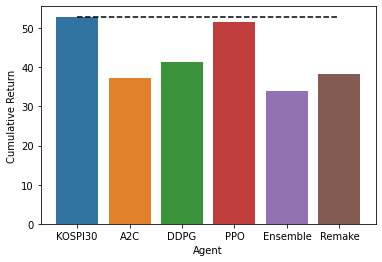

In [75]:
real_kospi = 52.946
ensemble_mean = df[df.agent=='ensemble']['Cumulative Return'].mean()
ppo_mean = df[df.agent=='ppo']['Cumulative Return'].mean()
a2c_mean = df[df.agent=='a2c']['Cumulative Return'].mean()
ddpg_mean = df[df.agent=='ddpg']['Cumulative Return'].mean()
remakeEnsemble_mean = df[df.agent=='remakeEnsemble']['Cumulative Return'].mean()
cumulative_return_mean = [real_kospi, a2c_mean, ddpg_mean, ppo_mean, ensemble_mean, remakeEnsemble_mean]
agent = ['KOSPI30','A2C','DDPG','PPO','Ensemble','Remake']
sns.barplot(y=cumulative_return_mean, x=agent )
sns.lineplot(y=real_kospi,x=agent,color='black',linestyle='--')
#plt.title('KOSPI mean of each agent culmulative return')
plt.xlabel('Agent')
plt.ylabel('Cumulative Return')
plt.savefig('./performance/kospi_agent_mean.png',dpi=500)

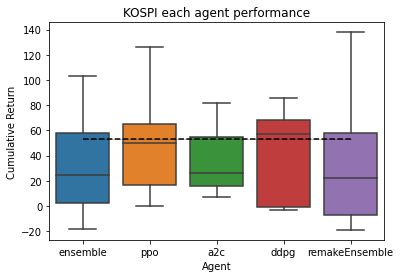

In [100]:
sns.boxplot(y=df['Cumulative Return'], x = df['agent'])
sns.lineplot(y=real_kospi,x=df['agent'],color='black',linestyle='--')
plt.title('KOSPI each agent performance')
plt.xlabel('Agent')
plt.ylabel('Cumulative Return')
plt.savefig('./performance/kopsi_agent_performance.png',dpi=500)